<div align="center">

<h1 style="color: #2E86AB; margin-top: 20px;">Python拓展单元：实用工具的调取与应用</h1><div style="background: linear-gradient(135deg, #667eea 0%, #764ba2 100%); padding: 15px; border-radius: 10px; color: white; margin: 20px 0;"> <p style="font-style: italic; margin: 0;"> 从文档整理到视觉呈现，大一新生的跨界提效指南 </p> </div></div>


### 本课学习方式：边看示例，边动手改，边验证结果

这一课建议不要只“顺着往下运行”，而要按下面的节奏学习：

1. **先看示例**：先看老师给出的代码在做什么，重点理解输入、输出和变化过程。
2. **再做试一试**：看到练习格时，先自己预测结果，再动手写代码。
3. **再改参数**：把数据、颜色、区间、数组大小等改一改，观察输出会怎么变。
4. **最后再总结**：每学完一小节，都回答一个问题：这个工具最适合帮我解决什么任务？

建议你把这节课当成“实验课”而不是“阅读材料”。真正有效的学习，不是把代码看懂，而是把代码改动以后还能解释为什么结果变了。

## 本课重点导航

这一课建议从“任务类型”和“工具分工”两个角度学习，而不是把它看成一串彼此独立的库函数。

1. NumPy 重点解决的是批量数值处理、数组组织、广播和条件筛选。
2. Matplotlib 重点解决的是把数据变成图表，并让图表真正表达重点。
3. OpenCV 重点解决的是图像读取、通道处理、像素修改和基础视觉输入输出。
4. `os` 与路径管理重点解决的是文件遍历、重命名、分类保存和批量自动化。
5. 文档处理扩展重点不在于记住所有库名，而在于知道如何把“扫描、转换、修改、登记”串成一条流程。

本课最重要的收获，不是背会多少 API，而是遇到数据、图表、图像、文件和文档任务时，能先想到合适的工具。

In [2]:
import importlib.util
import subprocess
import sys

dependency_groups = {
    "基础计算与图像处理": {
        "numpy": "numpy",
        "matplotlib": "matplotlib",
        "cv2": "opencv-python",
    },
    "文档处理与格式转换": {
        "docx": "python-docx",
        "openpyxl": "openpyxl",
        "pypdf": "pypdf",
        "reportlab": "reportlab",
        "pptx": "python-pptx",
        "pypandoc": "pypandoc",
    },
}

note_lines = [
    "提示：不同启动入口可能对应不同 Python 环境，安装前先确认当前 notebook 内核。",
    "本单元会统一检查本章常用依赖，只有缺失时才自动安装。",
]

def is_module_available(module_name):
    return importlib.util.find_spec(module_name) is not None

def check_group(group_name, packages):
    available_modules = []
    missing_packages = []

    for module_name, package_name in packages.items():
        if is_module_available(module_name):
            available_modules.append(module_name)
        else:
            missing_packages.append(package_name)

    print(f"\n[{group_name}]")
    if available_modules:
        print("已安装模块：" + ", ".join(available_modules))
    else:
        print("已安装模块：暂无")

    if missing_packages:
        print("缺失依赖：" + ", ".join(missing_packages))
    else:
        print("缺失依赖：无")

    return missing_packages

print("当前 notebook 使用的 Python 解释器：")
print(sys.executable)

for note in note_lines:
    print(note)

all_missing_packages = []
for group_name, packages in dependency_groups.items():
    all_missing_packages.extend(check_group(group_name, packages))

all_missing_packages = list(dict.fromkeys(all_missing_packages))

if all_missing_packages:
    print("\n检测到缺失依赖，开始自动安装：")
    print("pip install " + " ".join(all_missing_packages))
    try:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *all_missing_packages])
        importlib.invalidate_caches()
    except Exception as exc:
        print("\n自动安装失败：", exc)

    still_missing = []
    for packages in dependency_groups.values():
        for module_name, package_name in packages.items():
            if not is_module_available(module_name):
                still_missing.append(package_name)

    still_missing = list(dict.fromkeys(still_missing))
    if still_missing:
        print("\n以下依赖仍未安装成功，请手动执行：")
        print("pip install " + " ".join(still_missing))
    else:
        print("\n依赖补装完成，可以继续运行本教程。")
else:
    print("\n依赖检查通过，可以继续运行本教程。")

print("如果你已经安装过，但这里仍显示缺失，通常是因为当前 notebook 内核和安装库使用的 Python 环境不是同一个。")
print("如果刚完成自动安装，后续单元格仍报导入错误，重启内核后再从头运行一次。")

当前 notebook 使用的 Python 解释器：
d:\Python\python.exe
提示：不同启动入口可能对应不同 Python 环境，安装前先确认当前 notebook 内核。
本单元会统一检查本章常用依赖，只有缺失时才自动安装。

[基础计算与图像处理]
已安装模块：numpy, matplotlib, cv2
缺失依赖：无

[文档处理与格式转换]
已安装模块：docx, openpyxl, pypdf, reportlab, pptx, pypandoc
缺失依赖：无

依赖检查通过，可以继续运行本教程。
如果你已经安装过，但这里仍显示缺失，通常是因为当前 notebook 内核和安装库使用的 Python 环境不是同一个。
如果刚完成自动安装，后续单元格仍报导入错误，重启内核后再从头运行一次。


<div style="background: linear-gradient(135deg, #1e3c72 0%, #2a5298 100%); color: white; padding: 25px; text-align: center; border-radius: 12px; box-shadow: 0 4px 15px rgba(0,0,0,0.2); margin: 20px 0;">

# 📘 模块一：NumPy 科学计算基础

</div>


### 学习提醒：NumPy 模块看什么

NumPy 这部分学习时，重点不要落在“某个函数名会不会拼”，而要抓住批量处理思路。

- 向量化的核心是“一次处理一整批数据”，这和第1章里逐个元素写循环的思路不同。
- 广播的重点不是死背规则，而是看懂不同形状的数据怎样自动对齐。
- 布尔索引的核心价值是“按条件筛整批数据”，这是后面数据处理最常见的模式之一。
- 看到 `b = a` 或切片赋值时，要能意识到是否存在共享引用、原地修改和副本差异。

学习标准：看到一个数组处理案例时，你能说清它是在“批量算”“按条件筛”“按形状配合”，还是在“复制/共享同一份数据”。

## 1. Numpy特性———快速、批量计算

Numpy的特点就是快，可以快速的实现批量计算

In [14]:
# 导入库
import numpy as np
import time

# 场景：假设我们有 10000 个实验测量数据，需要求这些数据的平方

# 1. 传统 Python List 的做法
data_list = list(range(10000))
# print(data_list)
start_time = time.perf_counter() # 记录开始时间，单位为微秒
result_list = [x ** 2 for x in data_list]
print(f"List 耗时: {time.perf_counter() - start_time} 秒")

# 2. NumPy 的做法 (向量化)
data_array = np.arange(10000)  # 生成 10000 个 0 到 9999 的整数
# print(data_array)
start_time = time.perf_counter()
result_array = data_array ** 2  # 直接乘！不需要写 for 循环
print(f"NumPy 耗时: {time.perf_counter() - start_time} 秒")

List 耗时: 0.000323999999636726 秒
NumPy 耗时: 4.859999990003416e-05 秒


**试一试：正弦值批量计算**

任务目标：分别用传统 list 做法和 NumPy 数组做法，计算一组角度的正弦值。

操作建议：先完成弧度制这一题，再观察两种写法在代码长度和处理方式上的区别。提示可用 `np.sin(角度)`。

思考问题：如果角度数量越来越多，为什么 NumPy 的写法会更适合？

In [2]:
import math
import numpy as np
# ToDo：写代码求正弦值
# 题目：分别尝试传统 list 的做法和 NumPy 数组的做法

# 弧度制
angles_1 = [0, np.pi/6, np.pi/4, np.pi/3, np.pi/2]

# 1. 先写传统 list 做法，生成 sin_list
#    提示：可以逐个读取 angles_1 里的角度，再交给 np.sin 计算
sin_list = [math.sin(x) for x in angles_1]
print(sin_list)

# 2. 再写 NumPy 向量化做法
#    先把 angles_1 转成数组，例如命名为 angles_1_array
#    再一次性生成 sin_array
angles_array = np.array(angles_1)
sin_array = np.sin(angles_array)
print(sin_array)


# 3. 打印原始弧度列表、sin_list 和 sin_array
print(sin_array, sin_list)

# 4. 可以自己再加一个角度，比如 np.pi，观察两种写法是否都会同步更新


# 5. 观察结果，思考为什么会有差异


[0.0, 0.49999999999999994, 0.7071067811865476, 0.8660254037844386, 1.0]
[0.         0.5        0.70710678 0.8660254  1.        ]
[0.         0.5        0.70710678 0.8660254  1.        ] [0.0, 0.49999999999999994, 0.7071067811865476, 0.8660254037844386, 1.0]


<details>
<summary>参考答案：弧度制正弦值计算</summary>

```python
# 弧度制
angles_1 = [0, np.pi/6, np.pi/4, np.pi/3, np.pi/2]

# 传统 list 做法：一个个计算
sin_list = [np.sin(angle) for angle in angles_1]

# NumPy 做法：先转成数组，再一次性计算
angles_1_array = np.array(angles_1)
sin_array = np.sin(angles_1_array)

print("原始弧度列表：", angles_1)
print("传统 list 做法结果：", sin_list)
print("NumPy 向量化结果：", sin_array)
print("\n试着自己再加一个角度，比如 np.pi，再观察结果会不会一起更新。")
```

答案解析：
这题用来比较“逐个计算”和“向量化计算”的差别。传统 list 做法需要一个个处理角度；NumPy 做法可以把整组数据一次性交给 `np.sin` 计算，代码更短，也更适合后续的大批量数据处理。计算结果的细微差别通常来自浮点数精度与显示格式。

</details>

In [ ]:
# ToDo：写代码求正弦值
# 题目：角度制不能直接送进 np.sin，需要先转成弧度制
import numpy as np
import math
# 角度制
angles_2 = [0, 30, 45, 60, 90]

# 1. 先把角度制转换成弧度制，结果可命名为 angles_2_radians
#    提示：使用 np.deg2rad()
angles_2_radians = np.deg2rad(angles_2)

# 2. 分别写传统 list 做法和 NumPy 做法
#    传统做法可命名为 sin_list_deg
#    向量化结果可命名为 sin_array_deg
sin_list_deg = [math.sin(x) for x in angles_2_radians]
sin_array_deg = np.sin(angles_2_radians)

# 3. 打印原始角度、转换后的弧度、sin_list_deg 和 sin_array_deg
print(sin_array_deg)
print(sin_list_deg)

# 4. 想一想：为什么 90 度的正弦值最接近 1？
#因为？

[0.         0.5        0.70710678 0.8660254  1.        ]
[0.0, 0.49999999999999994, 0.7071067811865476, 0.8660254037844386, 1.0]


<details>
<summary>参考答案：角度制正弦值计算</summary>

```python
# 角度制
angles_2 = [0, 30, 45, 60, 90]

# 角度制不能直接送进 np.sin，需要先转成弧度制
angles_2_radians = np.deg2rad(angles_2)

sin_list_deg = [np.sin(np.deg2rad(angle)) for angle in angles_2]
sin_array_deg = np.sin(angles_2_radians)

print("原始角度列表：", angles_2)
print("转换后的弧度：", angles_2_radians)
print("传统 list 做法结果：", sin_list_deg)
print("NumPy 向量化结果：", sin_array_deg)
print("\n想一想：为什么 90 度的正弦值最接近 1？")
```

答案解析：
正弦值可以理解为单位圆上点的纵坐标。`90°` 对应单位圆最上方的点，它的纵坐标正好是 `1`，所以 `sin(90°)=1`。实际计算时显示成接近 `1` 的小数，是因为计算机用浮点数表示结果时会有微小误差。

</details>

借助numpy，我们不需要写循环，直接对整个数组进行数学运算。这个特点叫做**向量化计算**

## 2. 如何创建NumPy数组
常用的NumPy数组创建函数有：
- `np.array()`: 从列表或其他序列创建数组。
- `np.zeros()`: 创建全为0的数组。
- `np.ones()`: 创建全为1的数组。
- `np.linspace()`: 在指定范围内创建等间距的数组。
- `np.arange()`: 创建等差数列数组，类似 `range()`。
- `np.logspace()`: 在指定范围内创建等比间距的数组。
- `np.random.rand()`: 创建随机均匀分布数数组。
- `np.random.randint()`: 创建随机整数数组。
- `np.random.randn()`: 创建随机正态分布数数组。 


In [7]:
import numpy as np


# 创建全零数组
zeros = np.zeros((3, 4))  # 3行4列的全零数组
print("全零数组:\n", zeros)

# 创建全一数组
ones = np.ones((2, 3))  # 2行3列的全一数组
print("全一数组:\n", ones)

# 创建等差数列数组
range_arr = np.arange(0, 10, 2)  # 从0到10（不包括），步长2
print("等差数列数组:\n", range_arr)  # 输出: [0 2 4 6 8]

# 创建等间隔数组（指定元素个数）
linspace_arr = np.linspace(0, 1, 5)  # 从0到1，生成5个数
print("等间隔数组:\n", linspace_arr)  # 输出: [0.   0.25 0.5  0.75 1.  ]
# 创建随机数数组
random_arr = np.random.rand(3, 3)  # 3行3列的随机均匀分布数数组，元素值在[0, 1)之间
print("随机数数组:\n", random_arr)

# 创建随机整数数组
random_int_arr = np.random.randint(0, 10, (2, 2))  # 2行2列的随机整数数组，元素值在[0, 10)之间
print("随机整数数组:\n", random_int_arr)

# 创建单位矩阵（对角线为1）
diag_arr = np.eye(4)  # 4x4的对角线为1的数组
print("4x4单位矩阵:\n", diag_arr)


全零数组:
 [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
全一数组:
 [[1. 1. 1.]
 [1. 1. 1.]]
等差数列数组:
 [0 2 4 6 8]
等间隔数组:
 [0.   0.25 0.5  0.75 1.  ]
随机数数组:
 [[0.46113508 0.52947436 0.42842758]
 [0.27536963 0.37426897 0.96237083]
 [0.45116506 0.91443055 0.477087  ]]
随机整数数组:
 [[7 7]
 [8 7]]
4x4单位矩阵:
 [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


**试一试：观察 `np.zeros` 的参数写法**

任务目标：比较 `np.zeros((3, 4))` 和错误写法 `np.zeros(3, 4)` 的运行结果。

操作建议：先运行正确写法，再用 `try-except` 捕获错误写法的报错信息。

思考问题：为什么二维数组的形状必须整体写成 `(行, 列)`？

In [8]:
# ToDo：试试看如果把 np.zeros 写成错误形式，会发生什么

# 1. 先写出正确写法并打印结果
#    提示：先输出一行说明文字，再打印 np.zeros((3, 4))
print("正确写法的全零数组:")
print(np.zeros((3,4)))

# 2. 再尝试错误写法：np.zeros(3, 4)
#    建议用 try-except 捕获 TypeError，并把报错信息打印出来
print("\n尝试错误写法：np.zeros(3, 4)")
try:
    print(np.zeros(3, 4))
except TypeError as e:
    print("捕获到 TypeError:", e)


# 3. 最后打印你的结论
#    提示：shape 需要作为一个整体传入，所以二维数组要写成 (行, 列)
print("\n结论：np.zeros 的 shape 参数需要作为一个整体传入，正确写法是 np.zeros((行, 列))，错误写法会导致 TypeError。")

正确写法的全零数组:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

尝试错误写法：np.zeros(3, 4)
捕获到 TypeError: Cannot interpret '4' as a data type

结论：np.zeros 的 shape 参数需要作为一个整体传入，正确写法是 np.zeros((行, 列))，错误写法会导致 TypeError。


<details>
<summary>参考答案：np.zeros 参数写法</summary>

```python
print("先看正确写法：np.zeros((3, 4))")
print(np.zeros((3, 4)))

print("\n如果只写一对括号以外的两个参数，会发生什么？")
try:
    np.zeros(3, 4)
except TypeError as error:
    print("报错信息：", error)

print("\n结论：shape 需要作为一个整体传入，所以二维数组要写成 (行, 列)。")
```

答案解析：
`np.zeros` 的第一个核心参数是 `shape`，它表示数组形状。二维数组有两个维度，所以必须把“行数和列数”打包成一个元组 `(3, 4)` 传进去；如果写成 `np.zeros(3, 4)`，Python 会把 `4` 误认为别的参数，于是报错。

</details>

**数组属性**
NumPy数组有一些重要的属性：
- `shape`: 数组的维度信息，告诉我们有多少行、列等。
- `dtype`: 数组中元素的数据类型，如整数、浮点数等。
- `size`: 数组中元素的总数量。
- `ndim`: 数组的维数，告诉我们是1D、2D还是更高维度。
- `itemsize`: 数组中每个元素占用的字节数。
- `nbytes`: 数组中所有元素占用的总字节数。 

In [9]:
#数组属性
arr = np.array([[1, 2], [3, 4]])
print("数组:", arr)

# 查看数组形状
print("数组形状:", arr.shape)  # 输出: (2, 2) 表示 2 行 2 列

# 查看数组维数
print("数组维数:", arr.ndim)  # 输出: 2 表示二维数组

# 查看数组元素总数
print("数组元素总数:", arr.size)  # 输出: 4 表示数组中有 4 个元素

# 查看数组每个元素的字节大小
print("数组每个元素的字节大小:", arr.itemsize)  # 输出: 8 或 4，取决于系统默认设置

# 查看数组数据类型
print("数组数据类型:", arr.dtype)  # 输出: int64 或 int32，取决于系统默认设置


数组: [[1 2]
 [3 4]]
数组形状: (2, 2)
数组维数: 2
数组元素总数: 4
数组每个元素的字节大小: 8
数组数据类型: int64


**试一试：体验广播相加**

任务目标：生成一个 `4x5` 的全 9 数组和一个 `1x5` 的全 3 数组，并观察它们相加后的结果。

操作建议：先创建两个数组，再打印它们的形状和相加结果。

思考问题：为什么第二个数组只有 1 行，却仍然可以和第一个数组逐元素相加？

In [10]:
# ToDo：使用 np.full 生成一个全是 9 的 4 行 5 列数组，再生成一个全是 3 的 1 行 5 列数组
# 然后把两个数组相加

# 1. 创建 4x5 的 nine_array
nine_array = np.full((4,5),9)

# 2. 创建 1x5 的 three_array
three_array = np.full((1,5),3)

# 3. 计算相加结果 sum_array
sum_array = nine_array+three_array

# 4. 依次打印 nine_array、three_array 和 sum_array
#    最后观察：为什么第二个数组只有 1 行，也能和第一个数组相加？
print("nine_array:\n", nine_array)
print("three_array:\n", three_array)
print("sum_array:\n", sum_array)

nine_array:
 [[9 9 9 9 9]
 [9 9 9 9 9]
 [9 9 9 9 9]
 [9 9 9 9 9]]
three_array:
 [[3 3 3 3 3]]
sum_array:
 [[12 12 12 12 12]
 [12 12 12 12 12]
 [12 12 12 12 12]
 [12 12 12 12 12]]


<details>
<summary>参考答案：广播相加</summary>

```python
nine_array = np.full((4, 5), 9)
three_array = np.full((1, 5), 3)
sum_array = nine_array + three_array

print("4行5列、全是9的数组：\n", nine_array)
print("\n1行5列、全是3的数组：\n", three_array)
print("\n相加后的结果：\n", sum_array)
print("\n观察：为什么第二个数组只有 1 行，也能和第一个数组相加？这就是广播。")
```

答案解析：
第二个数组虽然只有 `1x5`，但它的列数和第一个数组一致，行数又是 `1`，所以 NumPy 会把这一行自动“复制理解”为 4 行，再和 `4x5` 的数组逐元素相加。这种机制就叫广播。

</details>

## 3. Numpy广播规则
- 如果两个数组的 ndim（维度数）不同，NumPy 会自动在维度较小的数组的形状（shape）前面补 1，直到两个数组的维度相同。
- 如果两个数组在某个维度上的大小相同，或者其中一个数组在该维度上的大小为 1，那么这两个数组在该维度上是兼容的。
- 广播之后，数组的形状将是每个维度上的最大值。
- 如果两个数组在某个维度上的大小不一致，且都不为1，则会抛出 ValueError 异常。

In [12]:
# 标量与数组的广播
a = np.array([1, 2, 3])
b = 2

# 标量 b 被广播到与 a 相同的形状 [2, 2, 2]
result = a * b
print("数组a与数字b的乘积：", result)


数组a与数字b的乘积： [2 4 6]


In [11]:
# 一维数组与二维数组的广播
a = np.array([[1, 2, 3],
              [4, 5, 6]])
print("二维数组a的形状：", a.shape)
b = np.array([10, 20, 30])
print("一维数组b的形状：", b.shape)

# b 被广播为与 a 相同的形状 (2, 3)
result = a + b
print("二维数组a和一维数组b的和：", result)


二维数组a的形状： (2, 3)
一维数组b的形状： (3,)
二维数组a和一维数组b的和： [[11 22 33]
 [14 25 36]]


**试一试：观察广播乘法的结果**

任务目标：计算一个 `1x2` 数组和一个 `3x1` 数组的乘积，并观察结果形状。

操作建议：先分别创建两个数组，打印它们的 shape，再计算乘积。

思考问题：它们为什么最终会得到一个 `3x2` 的结果？

In [14]:
# ToDo：观察一个 1 行 2 列数组和一个 3 行 1 列数组相乘会发生什么

# 1. 创建 1x2 的 row_array
row_array = np.array([[1,2]])

# 2. 创建 3x1 的 column_array
column_array = np.array([[10],[20],[30]])

# 3. 计算乘积 product_array
product_array = row_array * column_array

# 4. 打印 row_array、column_array、product_array，以及它们各自的 shape
print("row_array:\n", row_array)
print("column_array:\n", column_array)
print("product_array:\n", product_array)
print("row_array shape:", row_array.shape)
print("column_array shape:", column_array.shape)
print("product_array shape:", product_array.shape)

# 5. 想一想：它们为什么会得到一个 3x2 的结果？
#    提示：可以从“行方向扩展”和“列方向扩展”来理解广播
print("\n结论：在这个例子中，row_array 的形状是 (1, 2)，column_array 的形状是 (3, 1)。当它们相乘时，row_array 在行方向上被广播扩展为 (3, 2)，而 column_array 在列方向上被广播扩展为 (3, 2)。最终得到的 product_array 的形状是 (3, 2)，每个元素都是对应位置的乘积。")

row_array:
 [[1 2]]
column_array:
 [[10]
 [20]
 [30]]
product_array:
 [[10 20]
 [20 40]
 [30 60]]
row_array shape: (1, 2)
column_array shape: (3, 1)
product_array shape: (3, 2)

结论：在这个例子中，row_array 的形状是 (1, 2)，column_array 的形状是 (3, 1)。当它们相乘时，row_array 在行方向上被广播扩展为 (3, 2)，而 column_array 在列方向上被广播扩展为 (3, 2)。最终得到的 product_array 的形状是 (3, 2)，每个元素都是对应位置的乘积。


<details>
<summary>参考答案：广播乘法</summary>

```python
row_array = np.array([[2, 4]])
column_array = np.array([[1], [3], [5]])
product_array = row_array * column_array

print("1行2列数组：\n", row_array)
print("形状：", row_array.shape)
print("\n3行1列数组：\n", column_array)
print("形状：", column_array.shape)
print("\n广播后的乘积：\n", product_array)
print("结果形状：", product_array.shape)
print("\n提示：它们最终扩展成了 3 行 2 列再相乘。")
```

答案解析：
`1x2` 的数组可以沿着“行”方向扩展，`3x1` 的数组可以沿着“列”方向扩展，二者广播后都会被看作 `3x2`，再逐元素相乘，所以最终结果是 `3x2`。

</details>

## 4. Numpy数组的索引

In [15]:
#索引和切片
arr = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
print("原始数组:", arr)

# 取第1行
print("第1行:", arr[1]) 

# 取第0行第2列
print("第0行第2列:", arr[0, 2])  

# 切片：取前两行
print("前两行:", arr[:2])  


原始数组: [[1 2 3]
 [4 5 6]
 [7 8 9]]
第1行: [4 5 6]
第0行第2列: 3
前两行: [[1 2 3]
 [4 5 6]]


In [16]:
# 条件筛选，也叫布尔索引
a = np.arange(10)
print("数组a的元素：", a)
print("数组a中所有小于5的元素的平方：", a[a < 5] ** 2)


数组a的元素： [0 1 2 3 4 5 6 7 8 9]
数组a中所有小于5的元素的平方： [ 0  1  4  9 16]


**试一试：用布尔索引筛选有效问卷分数**

任务目标：从问卷分数中筛出 `0` 到 `100` 之间的有效数据，并计算平均值。

操作建议：先把列表转成 NumPy 数组，再写出两个条件同时成立的筛选表达式。初始数据：`survey_scores = [85, 92, -5, 78, 120, 95, 88, -10]`。

思考问题：如果只保留一个条件，比如只写 `>= 0`，结果会出什么问题？

In [17]:
# ToDo：使用“布尔索引”（条件筛选），把 0 到 100 之间的有效分数单独筛出来。
# 然后计算这些有效分数的平均值。

survey_scores = [85, 92, -5, 78, 120, 95, 88, -10]
score_array = np.array(survey_scores)

# 1. 写出筛选有效分数的条件，并把结果保存为 valid_scores
#    提示：要同时满足 >= 0 和 <= 100 两个条件
valid_scores = score_array[(score_array >= 0) & (score_array <= 100)]


# 2. 计算平均值，结果可命名为 average_score
average_score = valid_scores.mean()

# 3. 打印原始问卷分数、有效分数和平均值
#    提示：平均值可以保留两位小数再输出
print("原始问卷分数:", survey_scores)
print("有效分数:", valid_scores)
print("平均分数: {:.2f}".format(average_score))

# 4. 想一想：为什么这里要同时满足 >= 0 和 <= 100 这两个条件？
print("\n结论：在这个例子中，分数必须同时满足 >= 0 和 <= 100 这两个条件，才能被认为是有效的分数。因为分数通常应该在这个范围内，负数和超过100的分数都不符合常规的评分标准，所以需要同时设置这两个条件来筛选出合理的分数。")

原始问卷分数: [85, 92, -5, 78, 120, 95, 88, -10]
有效分数: [85 92 78 95 88]
平均分数: 87.60

结论：在这个例子中，分数必须同时满足 >= 0 和 <= 100 这两个条件，才能被认为是有效的分数。因为分数通常应该在这个范围内，负数和超过100的分数都不符合常规的评分标准，所以需要同时设置这两个条件来筛选出合理的分数。


<details>
<summary>参考答案：布尔索引筛选有效分数</summary>

```python
survey_scores = [85, 92, -5, 78, 120, 95, 88, -10]
score_array = np.array(survey_scores)

valid_scores = score_array[(score_array >= 0) & (score_array <= 100)]
average_score = valid_scores.mean()

print("原始问卷分数：", score_array)
print("有效分数：", valid_scores)
print("有效分数平均值：", round(float(average_score), 2))
print("\n想一想：为什么这里要同时满足 >= 0 和 <= 100 这两个条件？")
```

答案解析：
因为问卷满分是 `100` 分，所以有效数据必须落在 `0` 到 `100` 之间。只判断一侧条件不够，例如只写 `>=0` 会把 `120` 也保留下来；只写 `<=100` 又会把负数保留下来，所以两个条件都要满足。

</details>

**数组的共享引用**

在 NumPy 中，数组是对象，数组的赋值和切片操作可能会导致共享引用（shallow copy，类似超链接），这意味着修改一个数组可能会影响另一个数组。

**请思考**：为什么下面的代码输出结果是这样的？

In [ ]:
import numpy as np
a = np.array([1, 2, 3])
b = a # 这里 b 不是 a 的副本，而是指向同一个数组
print(a,id(a))
print(b,id(b))

b[0] = 100
print(a, b)

<details>
<summary>思考解析：为什么修改 b 以后，a 也变了？</summary>

答案解析：
这里的 `b = a` 不是“复制出一个新数组”，而是让 `b` 和 `a` 指向同一块数组数据。于是当你执行 `b[0] = 100` 时，修改的是这块共享数据本身，所以 `a` 和 `b` 打印出来都会变。若想得到互不影响的新数组，需要使用 `a.copy()`。

</details>

**试一试：把“共享引用”改成“独立副本”**

任务目标：在保持原数组不变的前提下，创建一个可单独修改的新数组。

操作建议：先比较 `b = a` 和 `b = a.copy()` 的差异，再观察修改 `b` 后 `a` 是否还会一起变化。

思考问题：什么时候你希望两个变量共享同一份数据，什么时候你更希望它们彼此独立？

In [19]:
# ToDo：让 b 变成 a 的独立副本，而不是共享同一块数据
import numpy as np

a = np.array([10, 20, 30])

# 1. 把下面这一行改成“真正复制”的写法
b = a.copy()  # 这样 b 就是 a 的独立副本了，不会共享同一块数据

# 2. 修改 b 的第一个元素
b[0] = 999

# 3. 同时打印 a 和 b，观察谁发生了变化
print("a =", a, "id(a) =", id(a))
print("b =", b, "id(b) =", id(b))



a = [10 20 30] id(a) = 1869742362224
b = [999  20  30] id(b) = 1869742367696


<details>
<summary>参考答案：共享引用与独立副本</summary>

```python
import numpy as np

a = np.array([10, 20, 30])
b = a.copy()

b[0] = 999

print("a =", a)
print("b =", b)
```

答案解析：
`a.copy()` 会创建一份新的数组数据，所以后续修改 `b` 时，不会再连带影响 `a`。这类区别在做实验数据预处理时非常重要，否则原始数据可能被无意改写。

</details>

<div style="background: linear-gradient(135deg, #1e3c72 0%, #2a5298 100%); color: white; padding: 25px; text-align: center; border-radius: 12px; box-shadow: 0 4px 15px rgba(0,0,0,0.2); margin: 20px 0;">

# 📘 模块二：Matplotlib 绘制数据图

</div>


In [20]:
# 中文补丁，需要每次使用 Matplotlib 绘图前都运行一次，确保中文显示正常

import matplotlib as mpl
from matplotlib import font_manager

def configure_matplotlib_for_cjk():
    """
    配置Matplotlib以正确显示中日韩(CJK)字符
    该函数会尝试设置一个可用的中文字体，以确保图表中的中文显示正常
    """
    preferred_fonts = [
        "PingFang SC",
        "Hiragino Sans GB",
        "Heiti SC",
        "STHeiti",
        "Songti SC",
        "Arial Unicode MS",
        "Microsoft YaHei",
        "SimHei",
        "Noto Sans CJK SC",
        "Source Han Sans SC",
        "WenQuanYi Zen Hei",
        "DejaVu Sans",
    ]
    available_fonts = {font.name for font in font_manager.fontManager.ttflist}
    for font_name in preferred_fonts:
        if font_name in available_fonts:
            mpl.rcParams["font.family"] = font_name
            break
    mpl.rcParams["axes.unicode_minus"] = False

configure_matplotlib_for_cjk()

## 1. 绘制图像

### 学习提醒：Matplotlib 模块看什么

Matplotlib 学习时，建议从“**图表在表达什么**”出发，而不是只看图有没有画出来。

- 折线图更适合看趋势，柱状图更适合看比较，散点图更适合看分布或相关性。
- 标题、坐标轴标签、图例、网格、标注和颜色都属于信息表达的一部分，不只是装饰。
- 同一份数据可以画成很多样子，但不是每一种都同样清楚。
- 当图上对象增多时，要学会控制文字密度和视觉重点，而不是把所有信息硬塞进去。

学习标准：看到一张图时，你能解释它为什么选这种图形、它最想让人看见的重点是什么。

In [21]:
import numpy as np
import matplotlib.pyplot as plt # pyplot 是 matplotlib 里专门负责绘图的模块，提供了很多方便的函数来创建各种类型的图表

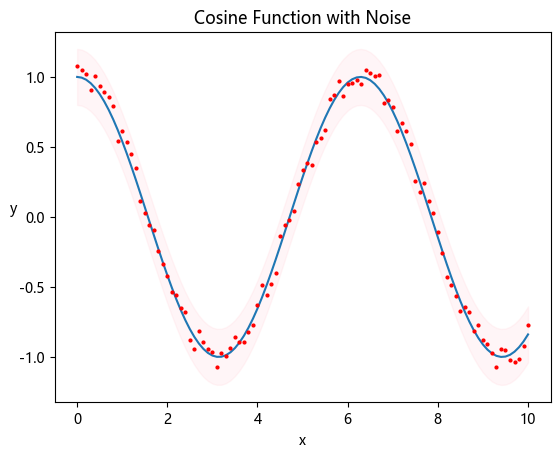

In [23]:
# 函数plot() ——绘制折线图
    
x = np.linspace(0,10,101)  # 生成从0 到 10 等分的101个数据
#print("横坐标：",x)

y = np.cos(x) # 计算余弦值
#print("纵坐标：",y)
err = (np.random.rand(101) - 0.5) * 0.2 # 生成一些随机误差，范围在-0.2到0.2之间
y_noisy = y + err # 在原始余弦值的基础上加上误差，得到带噪声的数据

plt.plot(x, y)
plt.plot(x, y_noisy, 'ro', markersize=2) # 绘制带噪声的数据点，ro表示红色圆点，markersize=2 表示点的大小
plt.fill_between(x, y - 0.2, y + 0.2, color='pink', alpha=0.15) # 在余弦曲线周围填充一个灰色区域，表示误差范围，alpha参数控制透明度
plt.title("Cosine Function with Noise") # 设置图表标题
plt.xlabel("x") # 设置 x 轴标签
plt.ylabel("y", rotation=0) # 设置 y 轴标签
plt.show()

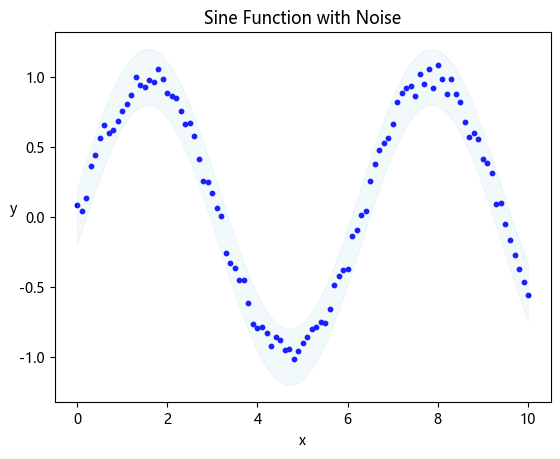

In [24]:
# 函数scatter() ——绘制散点图

x = np.linspace(0,10,101)  # 生成从0 到 10 等分的101个数据
y = np.sin(x) # 计算正弦值
y_noisy = y + (np.random.rand(101) - 0.5) * 0.2 # 加入随机误差

plt.scatter(x, y_noisy, color='blue', s=10) # 绘制带噪声的正弦数据点，s参数控制点的大小
plt.fill_between(x, y - 0.2, y + 0.2, color='lightblue', alpha=0.15) # 在正弦曲线周围填充一个灰色区域，表示误差范围，alpha参数控制透明度
plt.title("Sine Function with Noise") # 设置图表标题
plt.xlabel("x") # 设置 x 轴标签
plt.ylabel("y", rotation=0) # 设置 y 轴标签
plt.show()

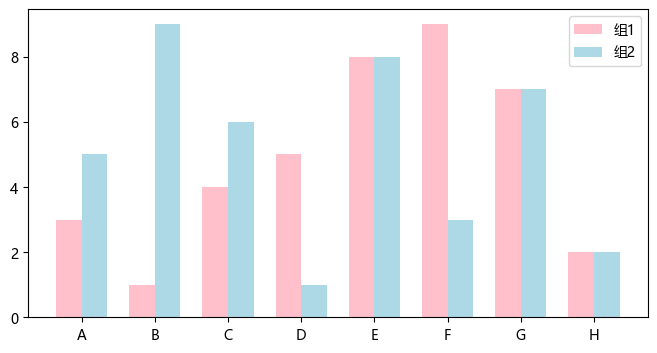

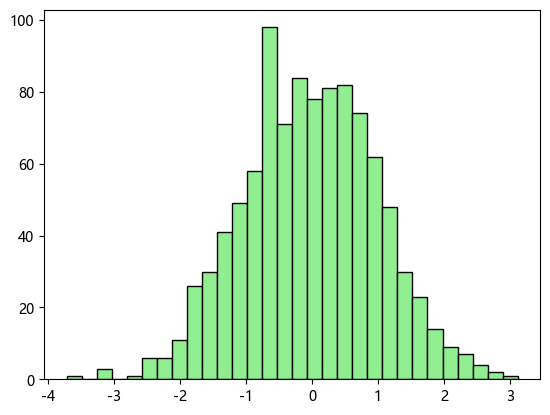

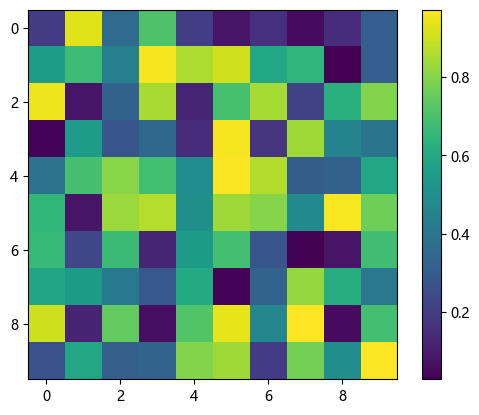

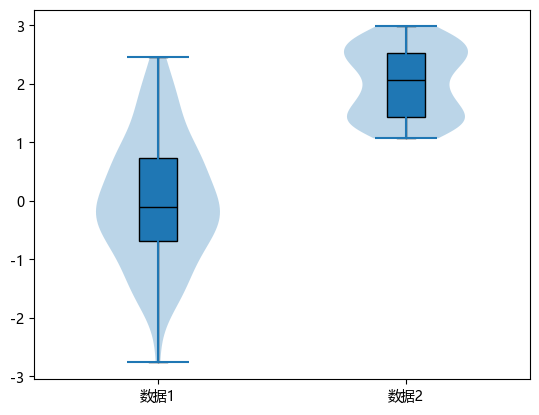

In [25]:
# 函数bar() ——绘制柱状图

x = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H']
y1 = [3,1,4,5,8,9,7,2]
y2 = [5,9,6,1,8,3,7,2]

# 绘制簇状柱状图
indices = np.arange(len(x)) # 生成x的索引
bar_width = 0.35

plt.figure(figsize=(8, 4))
plt.bar(indices - bar_width / 2, y1, width=bar_width, label='组1', color='pink') 
plt.bar(indices + bar_width / 2, y2, width=bar_width, label='组2', color='lightblue')
plt.xticks(indices, x) # 设置x轴刻度为原始类别标签
plt.legend() # 显示图例
plt.show()

# 函数hist() ——绘制直方图
x = np.random.randn(1000) # 生成1000个服从标准正态分布的随机数
plt.hist(x, bins=30, color='lightgreen', edgecolor='black') # bins参数指定直方图的柱子数量，color参数设置柱子的颜色，edgecolor参数设置柱子边缘的颜色
plt.show()

# 函数imshow() ——绘制热力图
data = np.random.rand(10, 10) # 生成10x10的随机均匀分布数据
plt.imshow(data, cmap='viridis') # 使用viridis配色方案，常用配色方案还有：'plasma', 'inferno', 'magma', 'cividis' 等
plt.colorbar() # 显示颜色条
plt.show()

# 绘制箱线图+小提琴图，箱线图可以显示数据的分布情况、中心位置和离群值，小提琴图则在箱线图的基础上增加了数据分布的密度信息
data1 = np.random.randn(100) # 生成100个服从标准正态分布的随机数
data2 = np.random.rand(100) * 2 + 1 # 生成100个均匀分布的随机数，范围在[1, 3)
data = [data1, data2] # 把两个数据集合成一个列表，传给箱线图函数绘制两组数据的箱线图
plt.boxplot(data, vert=True, patch_artist=True, medianprops=dict(color='black')) # vert参数控制箱线图的方向，patch_artist参数控制箱体是否填充颜色
plt.violinplot(data, vert=True) # 绘制小提琴图，vert参数控制小提琴图的方向
plt.xticks([1, 2], ['数据1', '数据2']) # 设置x轴刻度标签
plt.show()



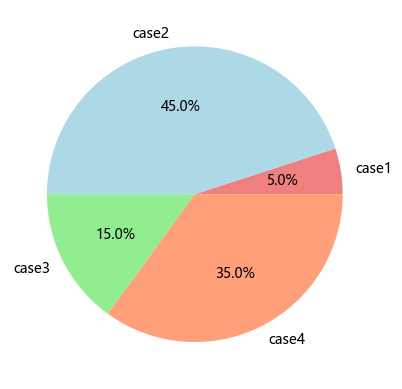

In [26]:
# 函数pie() ——绘制饼状图

# 定义数据集，包括大小和名称，颜色可选
soldNums = [0.05,0.45,0.15,0.35]
kinds = ['case1','case2','case3','case4']
colors = ['lightcoral', 'lightblue', 'lightgreen', 'lightsalmon']

plt.pie(soldNums, labels=kinds, autopct="%3.1f%%", colors=colors)
plt.show()

## 2. 图像的配件

- 设置标题
- 设置图例
- 设置横坐标和纵坐标的范围
- 设置坐标轴的标签
- 设置坐标轴的网格线样式
- 添加水平线
- 添加高亮区域
- 设置注释箭头
- 设置文本信息


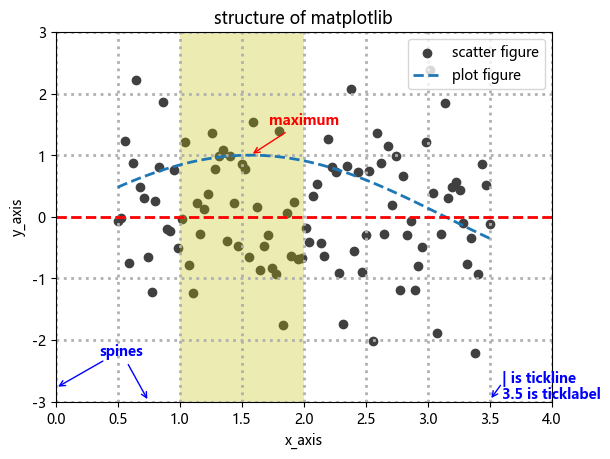

In [27]:
# 定义初始数据
x = np.linspace(0.5,3.5,100) # 生成区间 [0.5,3.5] 上的 x，共100个等间距数据点
y = np.sin(x) # 计算函数值 y（这里用 sin(x) 作为示例，你可以替换成其他函数）
y1 = np.random.randn(100) # 生成100个标准正态分布的随机数

# 绘制散点图
plt.scatter(x,y1,c='0.25',label='scatter figure') # c参数设置颜色，这里用灰度值0.25表示较浅的灰色

# 绘制折线图
plt.plot(x,y,ls='--',lw=2,label='plot figure') # ls参数设置线型，这里用'--'表示虚线；lw参数设置线宽，这里用2表示较粗的线

# 设置横坐标和纵坐标的范围
plt.xlim(0,4) 
plt.ylim(-3,3)

# 设置坐标轴的标签
plt.ylabel('y_axis')
plt.xlabel('x_axis')

# 设置坐标轴的网格线样式
plt.grid(ls=':',lw=2) # ls参数设置线型，这里用':'表示点线；lw参数设置线宽，这里用2表示较粗的线

# 添加水平线
plt.axhline(y=0,c='r',ls='--',lw=2) # y参数设置水平线的纵坐标位置，0表示x轴位置；c参数设置颜色，'r'表示红色；ls参数设置线型，'--'表示虚线

# 添加高亮区域
plt.axvspan(xmin=1.0,xmax=2,facecolor = 'y',alpha = 0.3) # xmin和xmax参数设置高亮区域的横坐标范围；facecolor参数设置填充颜色；alpha参数设置透明度

# 设置注释箭头
plt.annotate(
    'maximum', # 注释文本
    xy=(np.pi/2,1), # 注释点坐标，即函数最大值点
    xytext=(np.pi/2+0.15,1.5), # 注释文本位置，相对于注释点坐标
    weight='bold', color='r', # 设置文本加粗和颜色，'r'表示红色
    arrowprops = dict(arrowstyle='->',connectionstyle='arc3',color = 'r')) # '->'表示箭头，'arc3'表示弧形连接
plt.annotate('spines', xy=(0.75,-3), xytext=(0.35,-2.25), weight='bold', color='b', arrowprops = dict(arrowstyle='->',connectionstyle='arc3',color = 'b'))
plt.annotate('', xy=(0,-2.78), xytext=(0.4,-2.32), weight='bold', color='b', arrowprops = dict(arrowstyle='->',connectionstyle='arc3',color = 'b'))
plt.annotate('', xy=(3.5,-2.98), xytext=(3.6,-2.70), weight='bold', color='b', arrowprops = dict(arrowstyle='->',connectionstyle='arc3',color = 'b'))

# 设置文本信息
plt.text(3.6,-2.70,'| is tickline',weight = 'bold',color = 'b')
plt.text(3.6,-2.95,'3.5 is ticklabel',weight = 'bold',color = 'b')

# 设置标题
plt.title('structure of matplotlib')

# 设置图例
plt.legend()

**试一试：绘制美化版函数图像**

任务目标：在基础版函数图像的基础上，继续优化颜色、线宽、图例、网格和文字说明，并尝试在折线图的基础上加入散点图或柱状图，让图像信息更丰富。

操作建议：不要覆盖上一张图，建议至少增加 3 种美化或说明元素，再和基础版对比。

思考问题：哪些修改是在“让图更好看”，哪些修改是在“让信息更清楚”？

示例：配对云雨图（Paired Raincloud Plot）是一种结合了箱线图、散点图和密度图的复合图表，适合展示数据分布、集中趋势、个体差异和变化路径。

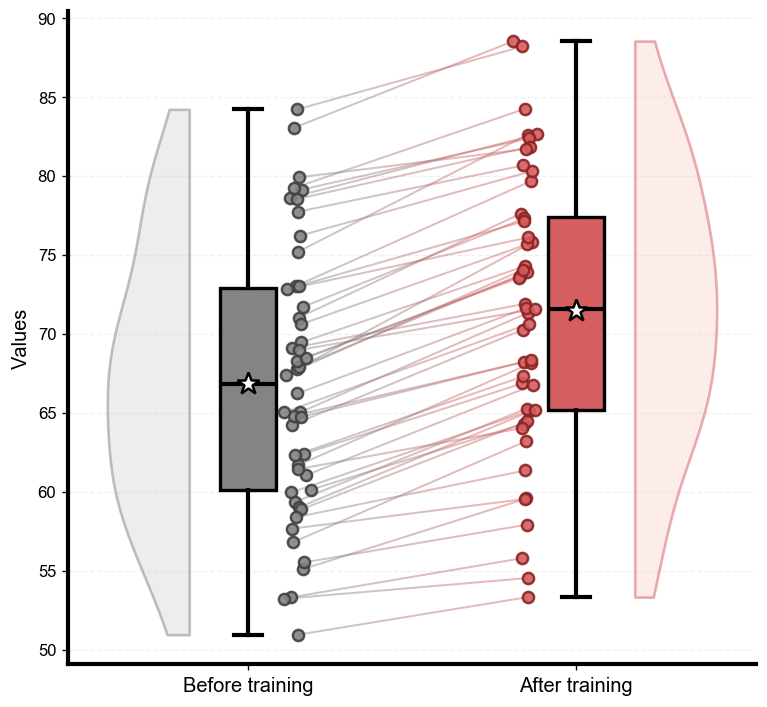


In [ ]:
# 绘制组合图表，例如在同一张图上绘制柱状图和折线图，可以使用双坐标轴来显示不同类型的数据，并添加图例和标注。


<details>

<summary>参考答案：配对 raincloud 图示例</summary>



```python

import numpy as np

import matplotlib.pyplot as plt

import matplotlib.colors as mcolors  # 引入颜色模块，方便后续创建渐变色

from matplotlib.collections import LineCollection  # 引入线段集合模块，用于绘制渐变连接线



pre_box = '#848484'

pre_cloud = '#DCDCDC'

pre_edge = '#404040'

post_box = '#D45E60'

post_cloud = '#FADCD9'

post_edge = '#8B2323'


# 样本构建
rng = np.random.default_rng(24) # 设置随机数生成器的种子，确保每次运行结果一致

before_core = rng.normal(66, 5.2, 34) # 生成核心样本，均值66，标准差5.2，数量34

before_high = rng.normal(80, 2.6, 8) # 生成高值样本，均值80，标准差2.6，数量8

before_low = rng.normal(56, 2.0, 6) # 生成低值样本，均值56，标准差2.0，数量6

before = np.clip(np.concatenate([before_core, before_high, before_low]), 48, 88) # 合并样本并限制在48到88之间

improve = np.concatenate([

    rng.normal(6.0, 1.2, 28), # 生成改善样本，均值6.0，标准差1.2，数量28

    rng.normal(4.2, 0.9, 12), # 生成改善样本，均值4.2，标准差0.9，数量12

    rng.normal(2.6, 0.8, 8)    # 生成改善样本，均值2.6，标准差0.8，数量8

])

after = np.clip(before + improve, 52, 94) # 计算训练后分数，并限制在52到94之间



fig, ax = plt.subplots(figsize=(6.5, 6), dpi=120)

pos_pre_violin, pos_pre_box, pos_pre_scatter = 0.82, 1.00, 1.15 # 定义训练前图形的水平位置

pos_post_scatter, pos_post_box, pos_post_violin = 1.85, 2.00, 2.18 # 定义训练后图形的水平位置

box_width = 0.17

half_box = box_width / 2



v_pre = ax.violinplot(before, positions=[pos_pre_violin], widths=0.50, showextrema=False) # 绘制训练前的 violin 图

v_post = ax.violinplot(after, positions=[pos_post_violin], widths=0.50, showextrema=False) # 绘制训练后的 violin 图

for body in v_pre['bodies']: # 对训练前的 violin 图进行美化，调整颜色、边框、线宽和透明度，显示左半边

    body.get_paths()[0].vertices[:, 0] = np.clip(body.get_paths()[0].vertices[:, 0], -np.inf, pos_pre_violin)

    body.set_facecolor(pre_cloud)

    body.set_edgecolor(pre_box)

    body.set_linewidth(1.6)

    body.set_alpha(0.50)

for body in v_post['bodies']: # 对训练后的 violin 图进行美化，调整颜色、边框、线宽和透明度，显示右半边
    
    body.get_paths()[0].vertices[:, 0] = np.clip(body.get_paths()[0].vertices[:, 0], pos_post_violin, np.inf) 

    body.set_facecolor(post_cloud)

    body.set_edgecolor(post_box)

    body.set_linewidth(1.6)

    body.set_alpha(0.50)


# 绘制箱线图，设置位置、宽度、颜色、线宽、显示均值和隐藏异常值等属性
box = ax.boxplot(

    [before, after],

    positions=[pos_pre_box, pos_post_box],

    widths=box_width,

    patch_artist=True,

    showfliers=False,

    showmeans=True,

    medianprops=dict(color='black', linewidth=2.5),

    whiskerprops=dict(color='black', linewidth=2.5),

    capprops=dict(color='black', linewidth=2.5),

    meanprops=dict(marker='*', markerfacecolor='white', markeredgecolor='black', markersize=14, markeredgewidth=1.5)

)

box['boxes'][0].set(facecolor=pre_box, edgecolor='black', linewidth=2.0)

box['boxes'][1].set(facecolor=post_box, edgecolor='black', linewidth=2.0)


# 为每个样本点添加水平抖动，增加散点的可读性，避免重叠，同时保持与箱线图的对应关系
jitter_pre = rng.normal(pos_pre_scatter, 0.015, len(before))

jitter_post = rng.normal(pos_post_scatter, 0.015, len(after))

ax.scatter(jitter_pre, before, color=pre_box, alpha=0.90, s=45, zorder=4, edgecolors=pre_edge, linewidths=1.5)

ax.scatter(jitter_post, after, color=post_box, alpha=0.90, s=45, zorder=4, edgecolors=post_edge, linewidths=1.5)


# 创建一个从训练前颜色到训练后颜色的线性渐变色，用于连接每个样本点的变化路径
cmap = mcolors.LinearSegmentedColormap.from_list('grad', [pre_box, post_box])

for i in range(len(before)):

    x_vals = np.linspace(jitter_pre[i], jitter_post[i], 50)

    y_vals = np.linspace(before[i], after[i], 50)

    points = np.array([x_vals, y_vals]).T.reshape(-1, 1, 2)

    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap=cmap, linewidths=1.2, alpha=0.45, zorder=2)

    lc.set_array(np.linspace(0, 1, len(segments)))

    ax.add_collection(lc)


# 计算统计信息：均值、提升最大样本、平均提升和中位数等，用于后续的图表注释
mean_before = before.mean()

mean_after = after.mean()

median_before = np.median(before)

median_after = np.median(after)

delta_mean = mean_after - mean_before

best_idx = np.argmax(after - before)

best_gain = after[best_idx] - before[best_idx]


# 在图表上添加注释，使用箭头指向对应的统计信息位置，并设置文字内容、字体大小、颜色和位置等属性，确保信息清晰且不与其他元素重叠
ax.annotate(

    f'训练前均值：{mean_before:.1f}',

    xy=(pos_pre_box, mean_before),

    xytext=(0.54, mean_before + 3.6),

    arrowprops=dict(arrowstyle='->', color=pre_edge, linewidth=1.2),

    fontsize=10,

    color=pre_edge

)

ax.annotate(

    f'训练后均值：{mean_after:.1f}',

    xy=(pos_post_box, mean_after),

    xytext=(2.23, mean_after + 4.2),

    arrowprops=dict(arrowstyle='->', color=post_edge, linewidth=1.2),

    fontsize=10,

    color=post_edge,

    ha='left'

)

ax.annotate(

    f'提升最大样本\n+{best_gain:.1f}',

    xy=(jitter_post[best_idx], after[best_idx]),

    xytext=(2.24, mean_after + 8.0),

    arrowprops=dict(arrowstyle='->', color=post_edge, linewidth=1.2),

    fontsize=9,

    color=post_edge,

    ha='left'

)

ax.text(

    2.58,

    after.max() + 1.8,

    f'平均提升：{delta_mean:.1f}',

    ha='right',

    va='center',

    fontsize=10,

    color='#7A1E1E',

    bbox=dict(boxstyle='round,pad=0.25', facecolor='white', edgecolor='#C9A0A0', alpha=0.92)

)

ax.annotate(

    f'训练前中位数：{median_before:.1f}',

    xy=(pos_pre_box + half_box, median_before),

    xytext=(0.55, median_before - 3.3),

    arrowprops=dict(arrowstyle='->', color=pre_edge, linewidth=1.1),

    fontsize=9,

    color=pre_edge

)

ax.annotate(

    f'训练后中位数：{median_after:.1f}',

    xy=(pos_post_box - half_box, median_after),

    xytext=(2.34, median_after - 4.2),

    arrowprops=dict(arrowstyle='->', color=post_edge, linewidth=1.1),

    fontsize=9,

    color=post_edge,

    ha='left'

)


# 设置坐标轴标签、标题、网格线、边框等图表元素，调整位置和样式，确保整体视觉平衡和信息突出
ax.set_xticks([pos_pre_box, pos_post_box])

ax.set_xticklabels(['训练前', '训练后'], fontsize=12)

ax.set_xlim(0.45, 2.78)

ax.set_ylabel('数值', fontsize=12)

ax.set_title('配对云雨图及关键信息标注', fontsize=13, pad=10)

ax.grid(axis='y', linestyle='--', linewidth=0.8, alpha=0.18)

ax.spines['top'].set_visible(False)

ax.spines['right'].set_visible(False)

ax.spines['bottom'].set_linewidth(2.5)

ax.spines['left'].set_linewidth(2.5)

plt.tight_layout()

plt.savefig('raincloud_output.png', dpi=120)

plt.show()

```



答案解析：
1. 这段代码创建了一个配对云雨图，结合了箱线图、散点图和密度图，展示了训练前后数据的分布、集中趋势和个体差异。
2. 通过设置不同的颜色、线宽、透明度和注释，增强了图表的信息表达，使得读者能够更清晰地理解数据的变化和统计信息。
3. 这种图表适合展示成对数据的变化，特别是在训练前后对比、实验组与对照组等场景中，可以同时展示分布、趋势和个体差异，提供更全面的视觉分析。
4. 绘图时需注意信息层次和视觉重点，避免过度装饰导致信息遮挡和内容混乱，同时确保图表的清晰和易读性。




</details>


## 3. 图像的组合

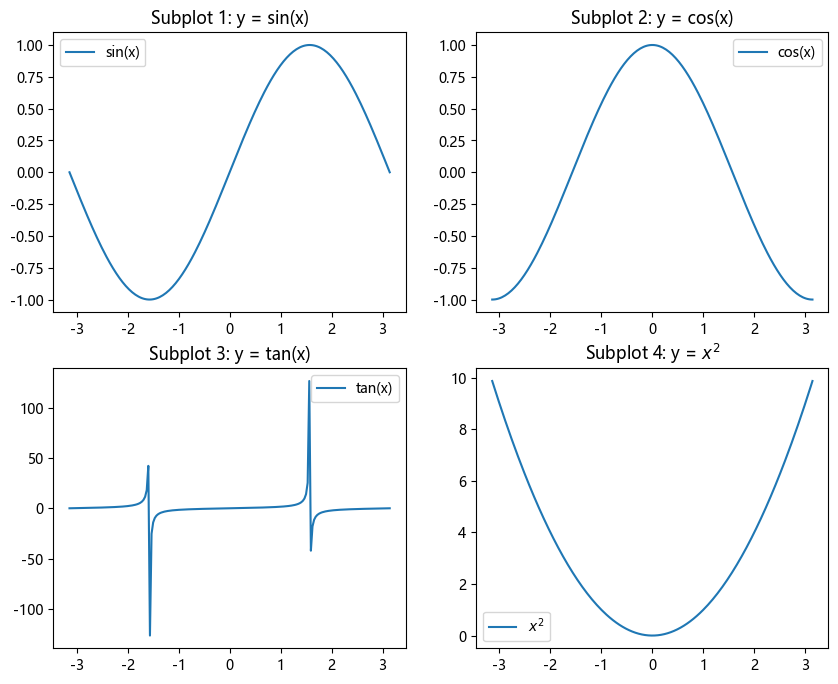

In [29]:
# 函数subplot() ——绘制网格区域中的几何形状相同的子区布局

# 定义初始数据
x = np.linspace(-np.pi,np.pi,200)
y1 = np.sin(x)
y2 = np.cos(x)
y3 = np.sin(x) / np.cos(x)
y4 = x ** 2

# 设置画布大小
plt.figure(figsize=(10,8))

# 绘制第一张子图
plt.subplot(2,2,1) # 2行2列，第1个位置
plt.plot(x,y1,label = "sin(x)")
plt.title("Subplot 1: y = sin(x)")
plt.legend()

# 绘制第二张子图
plt.subplot(2,2,2)
plt.plot(x,y2,label = "cos(x)")
plt.title("Subplot 2: y = cos(x)")
plt.legend()

# 绘制第三张子图
plt.subplot(2,2,3)
plt.plot(x,y3,label = "tan(x)")
plt.title("Subplot 3: y = tan(x)")
plt.legend()

# 绘制第四张子图
plt.subplot(2,2,4)
plt.plot(x,y4,label = "$x^2$")
plt.title("Subplot 4: y = $x^2$")
plt.legend()

plt.show()

**试一试**：已知2024年全国各省份全社会用电量统计如下，请选择其中的部分数据，绘制可视化图片：

| 排名 | 省份 | 2024年用电量（亿千瓦时） | 同比增长率 | 主要特点 |
|:---|:---|---:|---:|:---|
| 1 | 广东 | 9121.03 | 7.3% | 总量第一，占全国9.26% |
| 2 | 江苏 | 8486.93 | 8.3% | 占全国8.61% |
| 3 | 山东 | 8319.72 | 4.4% | 占全国8.44% |
| 4 | 浙江 | 6779.85 | 9.5% | 占全国6.88% |
| 5 | 内蒙古 | 5193.41 | 7.7% | 占全国5.27% |
| 6 | 河北 | 4986.67 | 4.8% | 占全国5.06% |
| 7 | 河南 | 4319.94 | 5.6% | 占全国4.38% |
| 8 | 新疆 | 4232.78 | 10.8% | 占全国4.30% |
| 9 | 四川 | 4017.71 | 7.8% | 占全国4.06% |
| 10 | 安徽 | 3597.86 | 11.9% | 增速全国第二 |
| 11 | 福建 | 3331.16 | 7.8% | 占全国3.38% |
| 12 | 山西 | 2971.75 | 3.0% | 占全国3.02% |
| 13 | 湖北 | 2943.76 | 8.8% | 占全国2.99% |
| 14 | 云南 | 2791.74 | 11.0% | 增速并列第三 |
| 15 | 辽宁 | 2733.68 | 2.7% | 占全国2.77% |
| 16 | 陕西 | 2600.15 | 6.1% | 占全国2.64% |
| 17 | 广西 | 2563.47 | 4.8% | 占全国2.60% |
| 18 | 湖南 | 2373.96 | 4.3% | 占全国2.41% |
| 19 | 江西 | 2180.47 | 7.6% | 占全国2.21% |
| 20 | 上海 | 1984.15 | 7.3% | 占全国2.01% |
| 21 | 贵州 | 1901.85 | 6.7% | 占全国1.93% |
| 22 | 甘肃 | 1746.32 | 6.2% | 占全国1.77% |
| 23 | 重庆 | 1611.98 | 11.0% | 增速并列第三 |
| 24 | 宁夏 | 1390.03 | 0.2% | 增速全国最低 |
| 25 | 北京 | 1389.41 | 2.3% | 占全国1.41% |
| 26 | 黑龙江 | 1208.44 | 2.1% | 占全国1.23% |
| 27 | 天津 | 1085.31 | 3.3% | 占全国1.10% |
| 28 | 青海 | 1053.51 | 3.5% | 占全国1.07% |
| 29 | 吉林 | 950.10 | 2.4% | 占全国0.96% |
| 30 | 海南 | 518.93 | 7.6% | 占全国0.53% |
| 31 | 西藏 | 154.17 | 13.9% | 增速全国第一 |

> 数据来源：中国电力企业联合会（CEC）、国家统计局

**试一试：设计两种层次的省份用电可视化**

任务目标：围绕同一份数据，尝试完成两种不同难度的设计。
1. 代表省份精细版：选取 6 到 8 个有代表性的省份，尽量把“排名、省份、用电量、增长率、主要特点”都表达出来。
2. 全省总览版：保留全部 31 个省份，重点展示整体排序、总量分布和增长率变化趋势。

操作建议：
1. 先决定哪些信息适合用“位置和长度”表达，哪些信息适合用“颜色、文字和注释”表达。
2. 如果做精细版，可以多用注释和说明文字；如果做总览版，要主动减少文字密度，优先保证可读性。
3. 建议至少组合两种图表元素，例如横向条形图加折线图，或柱状图加散点图。

思考问题：当一张图无法让 5 列信息都同等醒目时，你会把哪几列设为“主信息”，哪几列退到“辅助说明”？为什么？

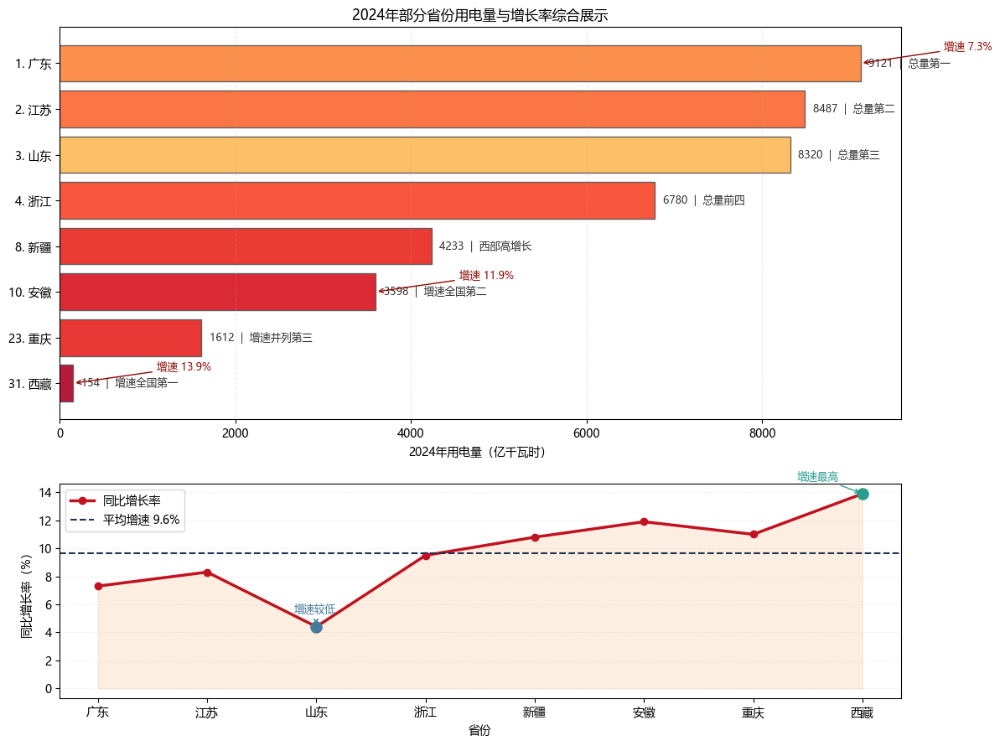

图片已保存为 province_power_usage_focus.png


In [31]:
import numpy as np
import matplotlib.pyplot as plt

# 选取“总量前列 + 增速有代表性”的 8 个省份，兼顾信息丰富度和版面清晰度
ranks = np.array([1, 2, 3, 4, 8, 10, 23, 31])
provinces = ["广东", "江苏", "山东", "浙江", "新疆", "安徽", "重庆", "西藏"]
power_usage = np.array([9121.03, 8486.93, 8319.72, 6779.85, 4232.78, 3597.86, 1611.98, 154.17])
growth_rate = np.array([7.3, 8.3, 4.4, 9.5, 10.8, 11.9, 11.0, 13.9])
features = [
    "总量第一",
    "总量第二",
    "总量第三",
    "总量前四",
    "西部高增长",
    "增速全国第二",
    "增速并列第三",
    "增速全国第一",
]

# 用颜色深浅附加表达增长率，让一张条形图同时承载两层信息
norm_growth = (growth_rate - growth_rate.min()) / (growth_rate.max() - growth_rate.min())
bar_colors = plt.cm.YlOrRd(0.35 + 0.55 * norm_growth)

fig, (ax1, ax2) = plt.subplots(
    2,
    1,
    figsize=(12, 9),
    gridspec_kw={"height_ratios": [3.3, 1.8]},
)

# 上半部分：横向条形图负责展示总量、排名和主要特点
labels = [f"{rank}. {province}" for rank, province in zip(ranks, provinces)]
y_pos = np.arange(len(provinces))
bars = ax1.barh(y_pos, power_usage, color=bar_colors, edgecolor="#555555", alpha=0.9)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(labels)
ax1.invert_yaxis()
ax1.set_xlabel("2024年用电量（亿千瓦时）")
ax1.set_title("2024年部分省份用电量与增长率综合展示")
ax1.grid(axis="x", linestyle="--", alpha=0.25)

for idx, (bar, usage, feature, growth) in enumerate(zip(bars, power_usage, features, growth_rate)):
    ax1.text(
        usage + 90,
        bar.get_y() + bar.get_height() / 2,
        f"{usage:.0f}  |  {feature}",
        va="center",
        fontsize=9,
        color="#333333",
    )
    if idx in [0, 5, 7]:
        ax1.annotate(
            f"增速 {growth:.1f}%",
            xy=(usage, idx),
            xytext=(usage + 950, idx - 0.28),
            arrowprops=dict(arrowstyle="->", color="#8D0801"),
            fontsize=9,
            color="#8D0801",
        )

# 下半部分：折线 + 散点负责展示增长率变化趋势
x = np.arange(len(provinces))
ax2.plot(x, growth_rate, color="#C1121F", marker="o", linewidth=2.5, label="同比增长率")
ax2.fill_between(x, growth_rate, color="#F4A261", alpha=0.18)
ax2.set_xticks(x)
ax2.set_xticklabels(provinces)
ax2.set_ylabel("同比增长率（%）")
ax2.set_xlabel("省份")
ax2.grid(axis="y", linestyle=":", alpha=0.3)
ax2.axhline(
    growth_rate.mean(),
    color="#1D3557",
    linestyle="--",
    linewidth=1.5,
    label=f"平均增速 {growth_rate.mean():.1f}%",
)

fastest_idx = int(np.argmax(growth_rate))
slowest_idx = int(np.argmin(growth_rate))
ax2.scatter(x[fastest_idx], growth_rate[fastest_idx], s=90, color="#2A9D8F", zorder=5)
ax2.scatter(x[slowest_idx], growth_rate[slowest_idx], s=90, color="#457B9D", zorder=5)
ax2.annotate(
    "增速最高",
    xy=(x[fastest_idx], growth_rate[fastest_idx]),
    xytext=(x[fastest_idx] - 0.6, growth_rate[fastest_idx] + 1.0),
    arrowprops=dict(arrowstyle="->", color="#2A9D8F"),
    fontsize=9,
    color="#2A9D8F",
)
ax2.annotate(
    "增速较低",
    xy=(x[slowest_idx], growth_rate[slowest_idx]),
    xytext=(x[slowest_idx] - 0.2, growth_rate[slowest_idx] + 1.0),
    arrowprops=dict(arrowstyle="->", color="#457B9D"),
    fontsize=9,
    color="#457B9D",
)

ax2.legend(loc="upper left")
plt.tight_layout()
plt.savefig("province_power_usage_focus.png", dpi=220)
plt.show()

print("图片已保存为 province_power_usage_focus.png")

<details>
<summary>参考答案：省份用电量高级可视化示例（两种方案）</summary>

**方案 A：代表省份精细版**

```python
import numpy as np
import matplotlib.pyplot as plt

# 选取“总量前列 + 增速有代表性”的 8 个省份，兼顾信息丰富度和版面清晰度
ranks = np.array([1, 2, 3, 4, 8, 10, 23, 31])
provinces = ["广东", "江苏", "山东", "浙江", "新疆", "安徽", "重庆", "西藏"]
power_usage = np.array([9121.03, 8486.93, 8319.72, 6779.85, 4232.78, 3597.86, 1611.98, 154.17])
growth_rate = np.array([7.3, 8.3, 4.4, 9.5, 10.8, 11.9, 11.0, 13.9])
features = [
    "总量第一",
    "总量第二",
    "总量第三",
    "总量前四",
    "西部高增长",
    "增速全国第二",
    "增速并列第三",
    "增速全国第一",
]

# 用颜色深浅附加表达增长率，让一张条形图同时承载两层信息
norm_growth = (growth_rate - growth_rate.min()) / (growth_rate.max() - growth_rate.min())
bar_colors = plt.cm.YlOrRd(0.35 + 0.55 * norm_growth)

fig, (ax1, ax2) = plt.subplots(
    2,
    1,
    figsize=(12, 9),
    gridspec_kw={"height_ratios": [3.3, 1.8]},
)

# 上半部分：横向条形图负责展示总量、排名和主要特点
labels = [f"{rank}. {province}" for rank, province in zip(ranks, provinces)]
y_pos = np.arange(len(provinces))
bars = ax1.barh(y_pos, power_usage, color=bar_colors, edgecolor="#555555", alpha=0.9)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(labels)
ax1.invert_yaxis()
ax1.set_xlabel("2024年用电量（亿千瓦时）")
ax1.set_title("2024年部分省份用电量与增长率综合展示")
ax1.grid(axis="x", linestyle="--", alpha=0.25)

for idx, (bar, usage, feature, growth) in enumerate(zip(bars, power_usage, features, growth_rate)):
    ax1.text(
        usage + 90,
        bar.get_y() + bar.get_height() / 2,
        f"{usage:.0f}  |  {feature}",
        va="center",
        fontsize=9,
        color="#333333",
    )
    if idx in [0, 5, 7]:
        ax1.annotate(
            f"增速 {growth:.1f}%",
            xy=(usage, idx),
            xytext=(usage + 950, idx - 0.28),
            arrowprops=dict(arrowstyle="->", color="#8D0801"),
            fontsize=9,
            color="#8D0801",
        )

# 下半部分：折线 + 散点负责展示增长率变化趋势
x = np.arange(len(provinces))
ax2.plot(x, growth_rate, color="#C1121F", marker="o", linewidth=2.5, label="同比增长率")
ax2.fill_between(x, growth_rate, color="#F4A261", alpha=0.18)
ax2.set_xticks(x)
ax2.set_xticklabels(provinces)
ax2.set_ylabel("同比增长率（%）")
ax2.set_xlabel("省份")
ax2.grid(axis="y", linestyle=":", alpha=0.3)
ax2.axhline(
    growth_rate.mean(),
    color="#1D3557",
    linestyle="--",
    linewidth=1.5,
    label=f"平均增速 {growth_rate.mean():.1f}%",
)

fastest_idx = int(np.argmax(growth_rate))
slowest_idx = int(np.argmin(growth_rate))
ax2.scatter(x[fastest_idx], growth_rate[fastest_idx], s=90, color="#2A9D8F", zorder=5)
ax2.scatter(x[slowest_idx], growth_rate[slowest_idx], s=90, color="#457B9D", zorder=5)
ax2.annotate(
    "增速最高",
    xy=(x[fastest_idx], growth_rate[fastest_idx]),
    xytext=(x[fastest_idx] - 0.6, growth_rate[fastest_idx] + 1.0),
    arrowprops=dict(arrowstyle="->", color="#2A9D8F"),
    fontsize=9,
    color="#2A9D8F",
)
ax2.annotate(
    "增速较低",
    xy=(x[slowest_idx], growth_rate[slowest_idx]),
    xytext=(x[slowest_idx] - 0.2, growth_rate[slowest_idx] + 1.0),
    arrowprops=dict(arrowstyle="->", color="#457B9D"),
    fontsize=9,
    color="#457B9D",
)

ax2.legend(loc="upper left")
plt.tight_layout()
plt.savefig("province_power_usage_focus.png", dpi=220)
plt.show()

print("图片已保存为 province_power_usage_focus.png")
```

答案解析：
这一版适合“少量对象、深度表达”。上半部分把排名、省份、用电量和主要特点放在一张横向条形图里，下半部分再单独讲增长率趋势。这样虽然只展示了 8 个省份，但原表 5 列信息基本都能被看见，而且重点省份也容易被教师拿来讲解。

**方案 B：全省总览版**

```python
import numpy as np
import matplotlib.pyplot as plt

# 把原表整理成结构化数据，后续切换视图会更方便
data = [
    (1, "广东", 9121.03, 7.3, "总量第一，占全国9.26%"),
    (2, "江苏", 8486.93, 8.3, "占全国8.61%"),
    (3, "山东", 8319.72, 4.4, "占全国8.44%"),
    (4, "浙江", 6779.85, 9.5, "占全国6.88%"),
    (5, "内蒙古", 5193.41, 7.7, "占全国5.27%"),
    (6, "河北", 4986.67, 4.8, "占全国5.06%"),
    (7, "河南", 4319.94, 5.6, "占全国4.38%"),
    (8, "新疆", 4232.78, 10.8, "占全国4.30%"),
    (9, "四川", 4017.71, 7.8, "占全国4.06%"),
    (10, "安徽", 3597.86, 11.9, "增速全国第二"),
    (11, "福建", 3331.16, 7.8, "占全国3.38%"),
    (12, "山西", 2971.75, 3.0, "占全国3.02%"),
    (13, "湖北", 2943.76, 8.8, "占全国2.99%"),
    (14, "云南", 2791.74, 11.0, "增速并列第三"),
    (15, "辽宁", 2733.68, 2.7, "占全国2.77%"),
    (16, "陕西", 2600.15, 6.1, "占全国2.64%"),
    (17, "广西", 2563.47, 4.8, "占全国2.60%"),
    (18, "湖南", 2373.96, 4.3, "占全国2.41%"),
    (19, "江西", 2180.47, 7.6, "占全国2.21%"),
    (20, "上海", 1984.15, 7.3, "占全国2.01%"),
    (21, "贵州", 1901.85, 6.7, "占全国1.93%"),
    (22, "甘肃", 1746.32, 6.2, "占全国1.77%"),
    (23, "重庆", 1611.98, 11.0, "增速并列第三"),
    (24, "宁夏", 1390.03, 0.2, "增速全国最低"),
    (25, "北京", 1389.41, 2.3, "占全国1.41%"),
    (26, "黑龙江", 1208.44, 2.1, "占全国1.23%"),
    (27, "天津", 1085.31, 3.3, "占全国1.10%"),
    (28, "青海", 1053.51, 3.5, "占全国1.07%"),
    (29, "吉林", 950.10, 2.4, "占全国0.96%"),
    (30, "海南", 518.93, 7.6, "占全国0.53%"),
    (31, "西藏", 154.17, 13.9, "增速全国第一"),
]

ranks = np.array([item[0] for item in data])
provinces = [item[1] for item in data]
power_usage = np.array([item[2] for item in data])
growth_rate = np.array([item[3] for item in data])
features = [item[4] for item in data]

# 依据增长率分成三档颜色，让全景图也能顺带看到“增速冷暖”
bar_colors = []
for value in growth_rate:
    if value >= 10:
        bar_colors.append("#D1495B")
    elif value >= 6:
        bar_colors.append("#EDAe49")
    else:
        bar_colors.append("#4F6D7A")

fig, (ax1, ax2) = plt.subplots(
    2,
    1,
    figsize=(14, 13),
    gridspec_kw={"height_ratios": [4.2, 1.8]},
)

# 上半部分：全部省份横向条形图，重点看排序和总量差异
y_pos = np.arange(len(provinces))
ax1.barh(y_pos, power_usage, color=bar_colors, edgecolor="white")
ax1.set_yticks(y_pos)
ax1.set_yticklabels([f"{rank}. {province}" for rank, province in zip(ranks, provinces)], fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("2024年用电量（亿千瓦时）")
ax1.set_title("2024年全国各省份用电量总览")
ax1.grid(axis="x", linestyle="--", alpha=0.25)

# 只标注少量关键点，避免 31 个省份全部写满
key_points = [0, 9, 23, 30]
for idx in key_points:
    ax1.text(
        power_usage[idx] + 120,
        idx,
        features[idx],
        va="center",
        fontsize=9,
        color="#333333",
    )

# 下半部分：按排名观察增长率变化趋势
ax2.plot(ranks, growth_rate, color="#1D3557", marker="o", linewidth=2, label="同比增长率")
ax2.fill_between(ranks, growth_rate, color="#A8DADC", alpha=0.25)
ax2.axhline(
    growth_rate.mean(),
    color="#E76F51",
    linestyle="--",
    linewidth=1.5,
    label=f"平均增速 {growth_rate.mean():.1f}%",
)
ax2.set_xlim(1, 31)
ax2.set_xticks([1, 5, 10, 15, 20, 25, 31])
ax2.set_xlabel("用电量排名")
ax2.set_ylabel("同比增长率（%）")
ax2.set_title("各省份增长率随排名的变化")
ax2.grid(axis="y", linestyle=":", alpha=0.3)

max_idx = int(np.argmax(growth_rate))
min_idx = int(np.argmin(growth_rate))
ax2.scatter(ranks[max_idx], growth_rate[max_idx], s=100, color="#2A9D8F", zorder=5)
ax2.scatter(ranks[min_idx], growth_rate[min_idx], s=100, color="#8D99AE", zorder=5)
ax2.annotate(
    f"{provinces[max_idx]}：{growth_rate[max_idx]:.1f}%",
    xy=(ranks[max_idx], growth_rate[max_idx]),
    xytext=(ranks[max_idx] - 6, growth_rate[max_idx] - 1.8),
    arrowprops=dict(arrowstyle="->", color="#2A9D8F"),
    fontsize=9,
    color="#2A9D8F",
)
ax2.annotate(
    f"{provinces[min_idx]}：{growth_rate[min_idx]:.1f}%",
    xy=(ranks[min_idx], growth_rate[min_idx]),
    xytext=(ranks[min_idx] + 1, growth_rate[min_idx] + 1.4),
    arrowprops=dict(arrowstyle="->", color="#8D99AE"),
    fontsize=9,
    color="#8D99AE",
)

ax2.legend(loc="upper right")
plt.tight_layout()
plt.savefig("province_power_usage_overview.png", dpi=220)
plt.show()

print("图片已保存为 province_power_usage_overview.png")
```

答案解析：
这一版适合“对象很多、先看整体”。它保留了全部 31 个省份，上半部分主要看排名和用电量分布，下半部分主要看增长率趋势。为了不让图面过密，这里不再给每个省份都写“主要特点”，而是只保留少数关键标注。也就是说，这一版牺牲了一部分细节表达，换来了更完整的全局视野。

总结建议：
1. 如果课堂重点是“如何把 5 列信息尽量编码进一张图”，优先使用方案 A。
2. 如果课堂重点是“如何在对象很多时控制信息密度”，优先使用方案 B。
3. 更成熟的做法不是追求一张图塞进所有信息，而是主动区分“精细讲解图”和“整体总览图”。

</details>

<div style="background: linear-gradient(135deg, #1e3c72 0%, #2a5298 100%); color: white; padding: 25px; text-align: center; border-radius: 12px; box-shadow: 0 4px 15px rgba(0,0,0,0.2); margin: 20px 0;">

# 📘 模块三：Opencv 图像处理

</div>


## 1. 安装 OpenCV-Python

In [33]:
# 第一次在当前环境使用 OpenCV 时再运行这一格
%pip install opencv-python
%pip install numpy

print("如果前面已经安装过，这一格通常不需要重复运行。")
print("安装完成后，如果导入仍报错，可以重启内核后再继续。")

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
如果前面已经安装过，这一格通常不需要重复运行。
安装完成后，如果导入仍报错，可以重启内核后再继续。


In [34]:
# 导入 OpenCV-Python 库
import cv2

# 打印 OpenCV-Python 版本号
print(cv2.__version__)

4.13.0


## 2. 图像基本操作

In [41]:
# 读入一幅小猫图像
img = cv2.imread("cats.jpeg")

print("图像像素数量:", img.size)
print("图像数据类型:", img.dtype)
print("图像形状:", img.shape) # 形状中包括行数、列数和通道数

# 对于一张彩色图像，其像素总数计算公式为：高度 × 宽度 × 通道数。
# 对于一张灰度图像，其像素总数计算公式为：高度 × 宽度。



图像像素数量: 536679
图像数据类型: uint8
图像形状: (417, 429, 3)


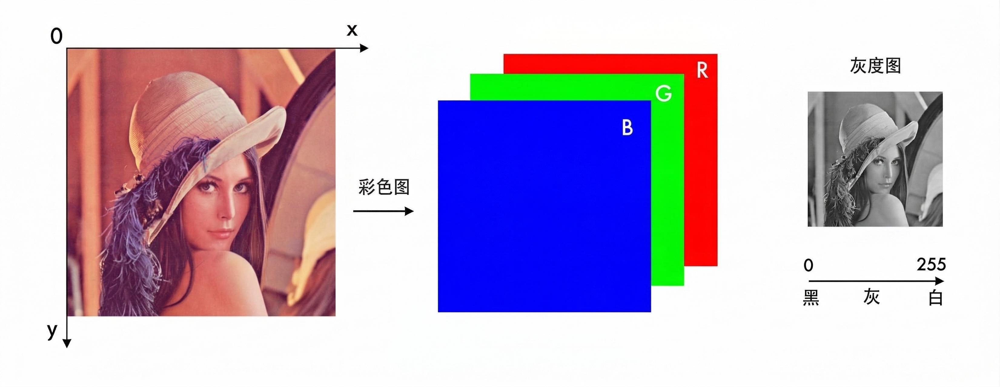

In [42]:
# 显示读入的图像
img = cv2.imread("cats.jpeg")
cv2.imshow("cats", img)

# cv2.waitKey() 使程序暂停，等待键盘按键
# 参数: 0 - 表示无限期等待，直到有按键被按下
# 参数: 1 - 等待1毫秒，主要作用是处理窗口事件队列
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1) 

-1

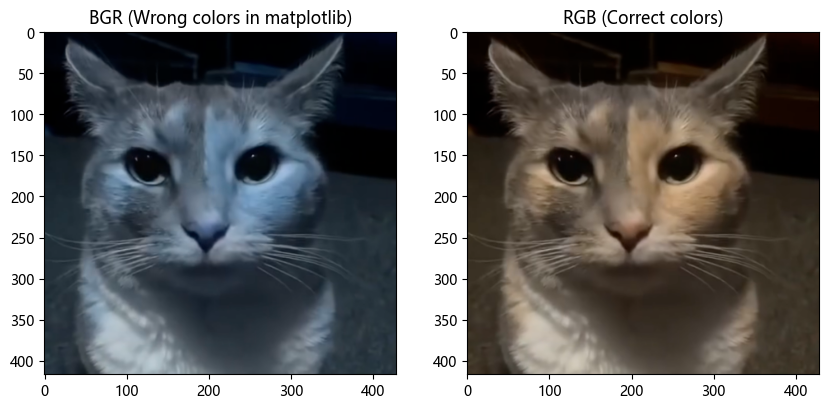

In [43]:
# 用opencv读取图像，配合matplotlib显示
import cv2
import matplotlib.pyplot as plt

# 使用OpenCV读取图像
img_bgr = cv2.imread("cats.jpeg")

# 转换为RGB格式以供matplotlib显示
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# 使用matplotlib显示图像
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_bgr)  # 错误的颜色（因为matplotlib期望RGB格式）
plt.title("BGR (Wrong colors in matplotlib)")

plt.subplot(1, 2, 2)
plt.imshow(img_rgb)  # 正确的颜色
plt.title("RGB (Correct colors)")
plt.show()

# OpenCV的默认顺序：BGR (蓝-绿-红)
# 内存中的排列：[Blue通道, Green通道, Red通道]

# Matplotlib和其他库的默认顺序：RGB (红-绿-蓝)  
# 内存中的排列：[Red通道, Green通道, Blue通道]

**试一试：保存灰度图并观察图像 shape**

任务目标：把小猫彩色图转换为灰度图，保存到当前文件夹，并比较转换前后的 shape。

操作建议：先读取图片并判断是否成功，再调用颜色转换函数完成灰度化，最后保存并打印 shape。

思考问题：为什么灰度图的 shape 会比彩色图少一个维度？

灰度图已保存为 cat_gray.jpg
原图 shape: (417, 429, 3)
灰度图 shape: (417, 429)

结论：灰度图比彩色图少了一个通道维度，因为灰度图只包含亮度信息，而不包含颜色信息。每个像素在灰度图中用一个数值表示其亮度，而在彩色图中，每个像素需要三个数值分别表示红、绿、蓝三个颜色通道的强度。因此，灰度图的形状通常是 (高度, 宽度)，而彩色图的形状是 (高度, 宽度, 3)。


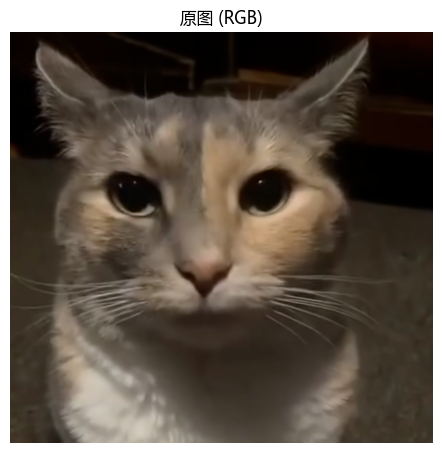

In [44]:
# ToDo: 试试真的保存一张灰度图的小猫图，再看看它的 shape

# 1. 读取图片，判断图片是否读取成功
#    提示：如果 img is None，就先输出提示信息
img = cv2.imread("cats.jpeg")
if img is None:
    print("图像读取失败，请检查文件路径和文件名是否正确。")


# 2. 把彩色图转成灰度图，结果可命名为 gray_img
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)



# 3. 保存灰度图，例如保存为 cat_gray.jpg
#    并输出保存成功提示
cv2.imwrite("cat_gray.jpg", gray_img)
print("灰度图已保存为 cat_gray.jpg")


# 4. 打印原图和灰度图的 shape
print("原图 shape:", img.shape)  # 彩色图通常是 (高度, 宽度, 3)
print("灰度图 shape:", gray_img.shape)  # 灰度图通常是 (高度, 宽度)，没有通道维度


# 5. 参考前面的对比显示方法，把原图和灰度图放在同一张画布中对比展示
#    提示：可以创建 1 行 2 列子图，左边放原图，右边放灰度图
#    原图如果要用 matplotlib 正确显示，需要先转成 RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("原图 (RGB)")
plt.axis("off")


# 6. 想一想：为什么灰度图比彩色图少了一个通道维度？
print("\n结论：灰度图比彩色图少了一个通道维度，因为灰度图只包含亮度信息，而不包含颜色信息。每个像素在灰度图中用一个数值表示其亮度，而在彩色图中，每个像素需要三个数值分别表示红、绿、蓝三个颜色通道的强度。因此，灰度图的形状通常是 (高度, 宽度)，而彩色图的形状是 (高度, 宽度, 3)。")


<details>
<summary>参考答案：保存灰度图并查看 shape</summary>

```python
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("cats.jpeg")

if img is None:
    print("未找到 cats.jpeg，请先确认图片文件在当前目录。")
else:
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    cv2.imwrite("cat_gray.jpg", gray_img)
    print("灰度图已保存为 cat_gray.jpg")
    print("原图 shape:", img.shape)
    print("灰度图 shape:", gray_img.shape)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("原始彩色图")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(gray_img, cmap="gray")
    plt.title("灰度图")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    print("\n想一想：为什么灰度图比彩色图少了一个通道维度？")
```

答案解析：
彩色图通常要分别记录红、绿、蓝三个通道的信息，所以 shape 往往是“高 × 宽 × 3”。灰度图只需要记录每个像素的明暗强弱，不再区分三种颜色，因此每个像素只保留一个数值，shape 就变成“高 × 宽”，少了颜色通道这一维。这一版还额外加入了和前面对比显示示例相同的双图布局，方便直接观察“彩色信息消失后，图像结构是否还保留”。

</details>

## 3. 像素点的基本操作

### 学习提醒：OpenCV 模块看什么

OpenCV 这部分最关键的，是把“图像处理”还原成“数组处理 + 输入输出操作”。

- 图像不是神秘对象，本质上仍然是带维度和通道的信息矩阵。
- 彩色图与灰度图的区别，核心在于通道数和数据结构不同。
- 局部覆盖、水印处理、像素替换，本质上通常都是对数组区域做切片修改。
- OpenCV 默认使用 BGR 顺序，这一点和很多同学更熟悉的 RGB 不同，学习时要特别留意。
- 摄像头或视频流相关操作结束后要记得释放资源，这是“能跑通”和“写规范”之间的重要差别。

学习标准：看到一个图像处理案例时，你能说出它是在“读图”“转通道”“改区域”还是“保存/释放资源”。

In [45]:
# 获取和修改像素点的值
img = cv2.imread("cats.jpeg")

# 获取400，208位置的像素值，包括RGB三通道
px = img[400, 208]
print("400，208位置的像素值为：", px)

# 只获取蓝色blue通道的值
px_blue = img[400,208,0]
print("400，208位置的蓝色通道值为：", px_blue)

# 修改x坐标400到450，y坐标200到250的区域为黑色
img[400:450,200:250] = [0,0,0]

# 弹出图像框，需手动关闭，不然程序阻塞在这里
cv2.imshow("cats", img) 
cv2.waitKey(0)                            
cv2.destroyAllWindows()
cv2.waitKey(1) 

400，208位置的像素值为： [64 75 83]
400，208位置的蓝色通道值为： 64


-1

**试一试：把指定区域改成白色**

任务目标：读取 `cats.jpeg`，把横坐标 `400` 到 `450`、纵坐标 `200` 到 `250` 的区域改成白色，并显示结果。

操作建议：先读取图片并判断是否成功，再修改局部区域像素，最后用适合显示的颜色格式展示图片。

思考问题：为什么白色要写成 `[255, 255, 255]`，而不是一个单独的数？

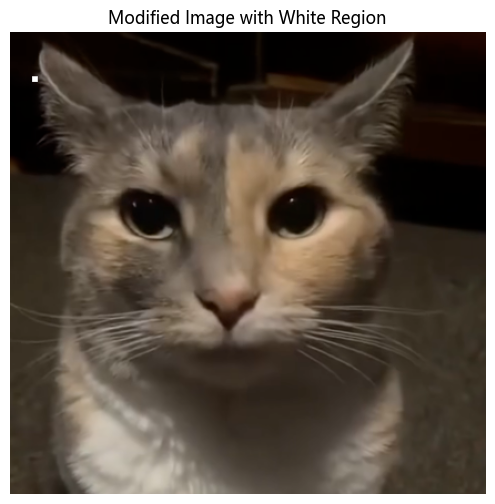

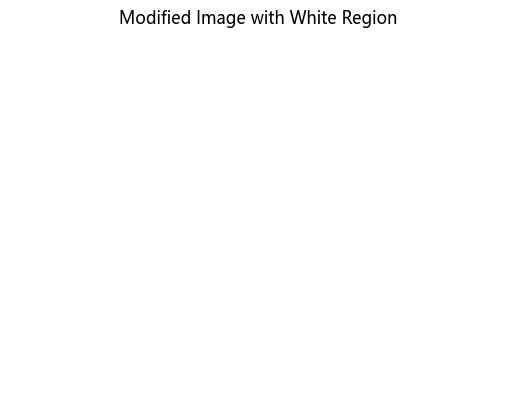


结论：在RGB颜色模型中，颜色是由红、绿、蓝三个通道的强度值组合而成的。每个通道的强度值范围通常是0到255，其中0表示该通道没有颜色（完全黑色），255表示该通道的颜色最强烈（完全白色）。因此，白色需要写成 [255, 255, 255]，表示红、绿、蓝三个通道都达到最大强度，从而组合成纯白色。


In [47]:
# ToDo：读取 cats.jpeg 图片，把指定区域改成白色并显示结果

# 1. 导入需要的库，例如 cv2 和 matplotlib.pyplot
import cv2
import matplotlib.pyplot as plt


# 2. 读取图片并判断是否成功读取
#    提示：如果图片不存在，先输出提示信息
img = cv2.imread("cats.jpeg")
if img is None:
    print("图像读取失败，请检查文件路径和文件名是否正确。")



# 3. 把横坐标 400 到 450、纵坐标 200 到 250 的区域改成白色
#    提示：白色区域需要写成三通道形式 [255, 255, 255]
img[40:45, 20:25] = [255, 255, 255]



# 4. 转成适合 matplotlib 显示的颜色格式，例如得到 img_rgb
#    然后创建画布并展示图片
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)
plt.title("Modified Image with White Region")
plt.axis("off")
plt.show()



# 5. 补充标题并关闭坐标轴显示
plt.title("Modified Image with White Region") # 设置标题
plt.axis("off") # 关闭坐标轴显示
plt.show()


# 6. 想一想：为什么白色要写成 [255, 255, 255]？
print("\n结论：在RGB颜色模型中，颜色是由红、绿、蓝三个通道的强度值组合而成的。每个通道的强度值范围通常是0到255，其中0表示该通道没有颜色（完全黑色），255表示该通道的颜色最强烈（完全白色）。因此，白色需要写成 [255, 255, 255]，表示红、绿、蓝三个通道都达到最大强度，从而组合成纯白色。")



<details>
<summary>参考答案：把局部区域改成白色</summary>

```python
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("cats.jpeg")

if img is None:
    print("未找到 cats.jpeg，请先确认图片文件在当前目录。")
else:
    img[400:450, 200:250] = [255, 255, 255]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.title("把指定区域改成白色后的图片")
    plt.axis("off")
    plt.show()

    print("观察：这一步本质上是在直接修改一个局部区域内所有像素的三通道值。")
```

答案解析：
在 8 位彩图里，每个通道的取值范围通常是 `0` 到 `255`。白色表示红、绿、蓝三个通道都取最大值，所以写成 `[255, 255, 255]`；黑色则是 `[0, 0, 0]`。

</details>

**OpenCV中的坐标系**
- 坐标原点: 位于图像的**左上角**。
- x轴: 代表列，方向从左到右。这对应于图像的宽度 (width)。
- y轴: 代表行，方向从上到下。这对应于图像的高度 (height)。

**试一试：生成一张纯蓝色图像**

任务目标：创建一个 `300x480` 的三通道图像，并让它显示为纯蓝色。

操作建议：先创建全零数组，再只修改蓝色通道，最后打印像素值并显示图像。

思考问题：为什么只改第 0 个通道就能得到纯蓝色？

imgblue shape: (100, 100, 3)
imgblue 左上角像素值: [255   0   0]


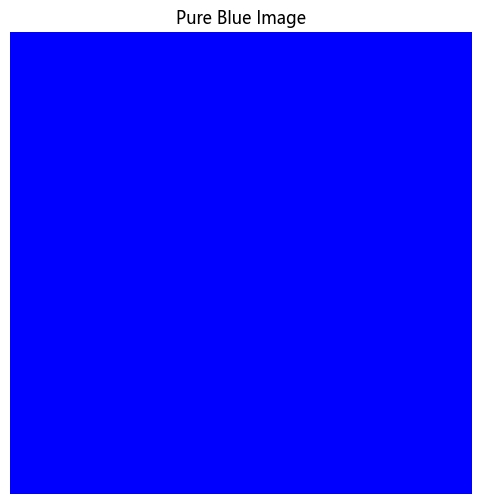


结论：在 OpenCV 中，图像的颜色通道顺序是 BGR（蓝-绿-红）。因此，第 0 个通道对应的是蓝色通道。当我们将第 0 个通道的值设为 255，而其他通道保持为 0 时，就表示蓝色通道的强度达到了最大值，而红色和绿色通道没有颜色信息，这样就得到了纯蓝色的图像。


In [48]:
# ToDo：将 imgblue 的蓝色通道设为 255，其他通道设为 0
# 然后把结果显示出来

# 1. 导入需要的库，例如 numpy 和 matplotlib.pyplot
import numpy as np
import matplotlib.pyplot as plt


# 2. 创建一个全零的三通道图像，命名为 imgblue
imgblue = np.zeros((100, 100, 3), dtype=np.uint8) # 创建一个100x100的全零图像，数据类型为uint8


# 3. 把 imgblue 的蓝色通道（第 0 个通道）设为 255，其他通道保持为 0
#    提示：在 OpenCV 中，蓝色通道是第 0 个通道
imgblue[:,:,0] = 255 # 将蓝色通道设为255，其他通道保持为0



# 4. 打印图像 shape 和左上角像素值
print("imgblue shape:", imgblue.shape) # 输出图像的形状
print("imgblue 左上角像素值:", imgblue[0, 0]) # 输出左上角像素值，应该是 [255, 0, 0]


# 5. 把 imgblue 转成适合 matplotlib 显示的 imgblue_rgb
#    提示：需要把 BGR 顺序转换成 RGB 顺序
imgblue_rgb = cv2.cvtColor(imgblue, cv2.COLOR_BGR2RGB) # 转换颜色格式，从BGR到RGB



# 6. 创建画布，显示纯蓝色图像，并补充标题
plt.figure(figsize=(6, 6))
plt.imshow(imgblue_rgb) # 显示图像
plt.title("Pure Blue Image") # 设置标题
plt.axis("off") # 关闭坐标轴显示
plt.show()


# 7. 想一想：为什么只改第 0 个通道就能得到纯蓝色？
print("\n结论：在 OpenCV 中，图像的颜色通道顺序是 BGR（蓝-绿-红）。因此，第 0 个通道对应的是蓝色通道。当我们将第 0 个通道的值设为 255，而其他通道保持为 0 时，就表示蓝色通道的强度达到了最大值，而红色和绿色通道没有颜色信息，这样就得到了纯蓝色的图像。")


<details>
<summary>参考答案：生成纯蓝色图像</summary>

```python
import cv2
import numpy as np
import matplotlib.pyplot as plt

imgblue = np.zeros([300, 480, 3], dtype="uint8")
imgblue[:, :, 0] = 255

print("蓝色图像的 shape:", imgblue.shape)
print("蓝色图像左上角像素值:", imgblue[0, 0])

imgblue_rgb = cv2.cvtColor(imgblue, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6, 4))
plt.imshow(imgblue_rgb)
plt.title("300x480 的纯蓝色图像")
plt.axis("off")
plt.show()

print("提示：在 OpenCV 中，蓝色通道是第 0 个通道。")
```

答案解析：
OpenCV 默认使用的是 `BGR` 通道顺序，不是 `RGB`。所以第 `0` 个通道表示蓝色，第 `1` 个表示绿色，第 `2` 个表示红色。把第 `0` 个通道全部设为 `255`，其余通道保持 `0`，得到的就是纯蓝色图像。

</details>

In [49]:
# 设置感兴趣的区域
# 比如我们要检测眼睛，而眼睛肯定在脸上，所以我们感兴趣的只有脸部区域，其他都不关心。
# 那么可以单独把脸截取出来，大大节省计算量，提高运行速度。

img = cv2.imread("cats.jpeg")

# 截取x坐标150到280，y坐标120到250感兴趣的区域
observerArea = img[150:280, 120:250]

cv2.imshow("Observer",observerArea)
cv2.waitKey(0)                            
cv2.destroyAllWindows()
cv2.waitKey(1) 

-1

**试一试：尝试去掉右下角水印**

任务目标：通过截取并复制邻近区域，尽量自然地覆盖 `cat.jpeg` 右下角的水印。

操作建议：先观察图片尺寸和水印位置，再选择一块纹理相近的区域复制过去，最后显示处理结果。

思考问题：这种“覆盖式去水印”方法适合什么样的背景？在什么情况下容易露出痕迹？

图像尺寸 - 高度: 417 宽度: 429


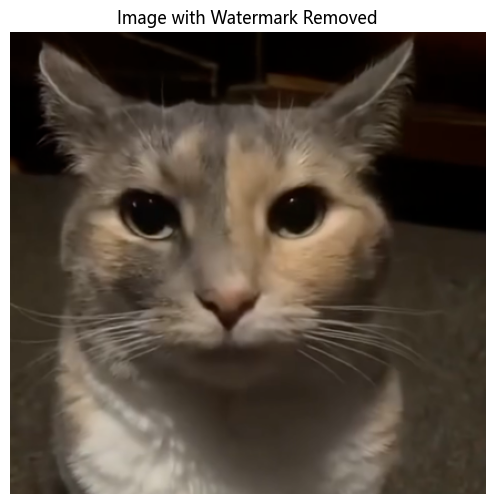


结论：这种“覆盖式去水印”方法更适合背景纹理比较均匀、没有明显结构的图像。例如，如果水印覆盖在一个纯色背景或者简单纹理的区域，这种方法可以比较自然地去除水印而不留下明显的痕迹。但是如果水印覆盖在一个复杂的背景或者有明显结构的区域，这种方法可能会留下明显的重复纹理或者不自然的过渡，反而会让去水印后的结果看起来更糟糕。因此，在选择去水印的方法时，需要根据具体图像的背景特点来决定。


In [50]:
# ToDo：通过截取图像，将 cat.jpeg 的右下角水印去掉，而且尽量没有违和感

# 1. 导入需要的库，例如 cv2 和 matplotlib.pyplot
import cv2
import matplotlib.pyplot as plt


# 2. 读取 cat.jpeg，并先判断图片是否读取成功
#    提示：如果图片不存在，先输出提示信息
img = cv2.imread("cats.jpeg")
if img is None:
    print("图像读取失败，请检查文件路径和文件名是否正确。")



# 3. 读取图像尺寸，例如得到 h, w
#    再估计水印区域和可复制的邻近区域
h, w = img.shape[:2] # 获取图像的高度和宽度
print("图像尺寸 - 高度:", h, "宽度:", w)



# 4. 从邻近位置复制一块纹理，结果可命名为 source_patch
#    然后覆盖到目标水印区域
source_patch = img[h-150:h-50, w-250:w-150] # 从图像的右下角邻近区域复制一块纹理
img[h-150:h-50, w-250:w-150] = source_patch # 将复制的纹理覆盖到水印区域

# 5. 把处理后的图片转成适合 matplotlib 显示的格式，例如 img_rgb
#    并显示结果
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # 转换颜色格式，从BGR到RGB
plt.figure(figsize=(8, 6))
plt.imshow(img_rgb) # 显示图像
plt.title("Image with Watermark Removed") # 设置标题
plt.axis("off") # 关闭坐标轴显示
plt.show()


# 6. 想一想：这种“覆盖式去水印”更适合什么样的背景？
print("\n结论：这种“覆盖式去水印”方法更适合背景纹理比较均匀、没有明显结构的图像。例如，如果水印覆盖在一个纯色背景或者简单纹理的区域，这种方法可以比较自然地去除水印而不留下明显的痕迹。但是如果水印覆盖在一个复杂的背景或者有明显结构的区域，这种方法可能会留下明显的重复纹理或者不自然的过渡，反而会让去水印后的结果看起来更糟糕。因此，在选择去水印的方法时，需要根据具体图像的背景特点来决定。")


<details>
<summary>参考答案：覆盖式去水印示例</summary>

```python
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("cats.jpeg")

if img is None:
    print("未找到 cats.jpeg，请先确认图片文件在当前目录。")
else:
    h, w = img.shape[:2] # 获取图像的高度和宽度
    source_patch = img[h - 180:h - 100, w - 150:w - 50].copy() # 复制邻近区域的纹理
    img[h - 110:h - 30, w - 150:w - 50] = source_patch # 贴到目标水印区域

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.title("用邻近区域覆盖右下角水印")
    # plt.axis("off")
    plt.show()

    print("这是一种最基础的“覆盖式去水印”思路：")
    print("从邻近位置复制一块纹理，贴到水印区域上。")
    print("你可以继续调整 source_patch 和目标区域，让结果更自然。")
```

答案解析：
这里不是“真正理解图片内容后再修复”，而是用邻近区域的纹理去覆盖目标区域，所以适合面积较小、背景较均匀的水印。若背景复杂，单纯复制粘贴就容易留下痕迹，这时通常需要更高级的图像修复方法。

</details>

## 4. 视频操作

In [51]:
# 使用 cv2.VideoCapture(0) 创建 VideoCapture 对象，参数 0 指的是默认摄像头。
# 如果电脑上有多个摄像头，可以尝试传入 1、2 等编号。
camera = cv2.VideoCapture(0)

try:
    if not camera.isOpened():
        print("无法打开摄像头，请检查设备连接、系统权限或是否被其他程序占用。")
    else:
        while True:
            # 一帧一帧采集图像
            ret, frame = camera.read() # ret 是布尔值，表示是否成功读取到图像；frame 是读取到的图像数据，如果读取失败则为 None
            frame = cv2.flip(frame, 1) # 1 表示水平翻转

            if not ret or frame is None:
                print("读取摄像头画面失败，程序将安全退出。")
                break

            # 显示图像
            cv2.imshow('Press q to Exit', frame)

            # 按下 q 键退出
            key = cv2.waitKey(1) & 0xFF
            if key == ord('q'):
                break
finally:
    # 无论是正常退出、读取失败还是运行中报错，都要释放资源
    camera.release()
    cv2.destroyAllWindows()
    cv2.waitKey(1)

**试一试：调用摄像头拍照并保存**

任务目标：用 OpenCV 打开摄像头，按空格键保存一张照片到本地，按 `q` 退出。

操作建议：按“打开设备 -> 循环读取画面 -> 响应按键 -> 释放资源”的顺序完成。

思考问题：为什么程序结束时一定要释放摄像头并关闭窗口？

In [ ]:
# 使用 AI 工具完成此任务，或自己独立完成
# 任务：调用摄像头，按空格拍照并保存为 captured_photo.jpg，按 q 退出

# 1. 导入 cv2


# 2. 打开摄像头


# 3. 判断摄像头是否成功打开
#    提示：如果没有打开成功，先输出提示信息


# 4. 如果打开成功，进入循环读取画面并显示
#    提示：可以先准备一个 photo_saved 变量记录是否已经保存照片


# 5. 在循环里响应按键
#    按空格保存 captured_photo.jpg，按 q 退出


# 6. 循环结束后，记得释放摄像头并关闭窗口
#    最后可以根据 photo_saved 判断是否输出补充提示



<details>
<summary>参考答案：调用摄像头拍照并保存</summary>

```python
import cv2

camera = cv2.VideoCapture(0)

if not camera.isOpened():
    print("摄像头打开失败，请检查是否有权限或设备是否可用。")
else:
    print("按空格键拍照，按 q 退出。")
    photo_saved = False

    while True:
        ret, frame = camera.read()
        if not ret:
            print("无法读取摄像头画面。")
            break
        frame = cv2.flip(frame, 1) # 水平翻转
        cv2.imshow("Press SPACE to capture / q to quit", frame)
        key = cv2.waitKey(1) & 0xFF # 等待键盘输入,并且只保留最后一个字节的值

        if key == ord(" "):
            cv2.imwrite("captured_photo.jpg", frame)
            print("照片已保存为 captured_photo.jpg")
            photo_saved = True
        if key == ord("q"):
            break

    camera.release()
    cv2.destroyAllWindows()
    cv2.waitKey(1)

    if not photo_saved:
        print("本次没有保存照片，你可以重新运行后再尝试。")
```

答案解析：
这段代码的核心流程是“打开摄像头 -> 循环读取画面 -> 根据按键执行操作 -> 最后释放资源”。其中 `while True` 用来持续显示实时画面，空格键触发保存，`q` 键负责退出；结束后一定要释放摄像头并关闭窗口，否则设备可能一直被占用。

</details>

<div style="background: linear-gradient(135deg, #1e3c72 0%, #2a5298 100%); color: white; padding: 25px; text-align: center; border-radius: 12px; box-shadow: 0 4px 15px rgba(0,0,0,0.2); margin: 20px 0;">

# 📘 模块四：Os 文件管理

</div>


## 1. 路径
- **相对路径 vs 绝对路径**：简单通俗地解释（绝对路径就像完整的收货地址，相对路径就像“隔壁邻居”）。

- **跨平台兼容性**：Windows 用 `\`，Mac/Linux 用 `/`。如果手动写死，代码换台电脑就报错。

- **Python 中的路径操作**：推荐使用 `os.path` 或 `pathlib` 模块来构建路径，避免手动拼接带来的错误。

In [52]:
from pathlib import Path # 导入 Path 类，它是 pathlib 模块中用于处理文件路径的核心类，提供了面向对象的方式来操作路径

# 1. 跨平台拼接多级路径（Windows、macOS、Linux 都兼容）
folder_path = Path("research_data") / "2024_experiments"
file_name = "experiment_results.csv"
full_path = folder_path / file_name
print(f"生成的路径: {full_path}")

# 2. 检查文件或文件夹到底存不存在？(防止程序崩溃)
if full_path.exists():
    print("数据文件已就绪！")
else:
    print("找不到文件，请检查数据源。")

生成的路径: research_data\2024_experiments\experiment_results.csv
找不到文件，请检查数据源。


## 2. 核心功能

查看：
- `os.getcwd()`：我在哪？（获取当前工作目录 - Get Current Working Directory）。
- `os.listdir(path)`：我周围有什么？（列出目录下的所有文件和文件夹）。

移动：
- `os.chdir(path)`：去别的地方（改变当前工作目录 - Change Directory）。

增改删：
- `os.mkdir(dirname)`：平地起高楼（创建单层文件夹）。
- `os.rename(old, new)`：改头换面（重命名文件或文件夹）。
- `os.remove(filename)`：删除文件（一定要注意，**用代码删除的文件不会进回收站，直接灰飞烟灭**！使用时一定要小心）


In [53]:
import os # 导入 os 模块，它提供了许多与操作系统交互的函数，用于文件和目录的管理

# 我在哪？
current_location = os.getcwd()
print("当前所处坐标：", current_location)

# 我周围有什么？
surroundings = os.listdir(current_location)
print("发现以下文件：", surroundings)

当前所处坐标： g:\学业\2025大一下\人工智能基础\wk2
发现以下文件： ['cats.jpeg', 'cat_gray.jpg', 'province_power_usage_focus.png', 'Python (1).ipynb', 'Python第2课0325.ipynb']


In [54]:
from pathlib import Path
print("转移前位置：", os.getcwd())

# 设定目标坐标（注意：这里使用 r"" 原生字符串，避免转义问题）
target_path = r"c:/Users/你的用户名/Desktop/target/"  # 请替换成你想去的目录路径，你可以故意写错斜杠看看是否会报错

if Path(target_path).exists():
    print("目标路径存在，开始切换！")
    os.chdir(target_path) # 切换当前工作目录到目标路径
    print("转移后位置：", os.getcwd())
    print("发现以下文件：", os.listdir("."))
else:
    print("找不到目标路径，请检查数据源。")


转移前位置： g:\学业\2025大一下\人工智能基础\wk2
找不到目标路径，请检查数据源。


关于文件增改删的小例子：

In [ ]:
# 1. 创建文件夹
# 确保我们现在处于一个安全的测试目录
test_path = r"c:/Users/你的用户名/Desktop/test1" # 请替换成你想测试的目录路径，建议先在桌面创建一个 test 文件夹，避免误操作影响重要文件
test_path = Path(test_path) # 把字符串路径转换成 Path 对象，方便后续操作
test_path.mkdir(exist_ok=True) # 创建 test 文件夹，如果已经存在就不报错

if Path(test_path).exists():
    print("测试路径存在，开始切换！")
    os.chdir(test_path)
    print("当前测试位置：", os.getcwd())
    if not Path("Secret_Base").exists(): # 先检查 Secret_Base 文件夹是否已经存在，避免重复创建
        os.mkdir("Secret_Base") # 创建一个名为 Secret_Base 的文件夹
        print("【行动1】已成功建立秘密基地！")
    else:
        print("秘密基地已经存在了，不需要重复创建。")
else:
    print("找不到测试路径，请检查数据源。")


In [ ]:
# 2. 文件重命名
os.rename("Secret_Base", "Boring_Homework")
print("【行动2】文件已重命名成‘无聊的作业’，十分安全！")


In [ ]:
# 3.生成一个txt文件，用于演示删除

# 注意：这里使用 with 语句，可以自动关闭文件,避免忘记关闭导致资源泄露；encoding="utf-8" 参数确保写入中文时不会出现编码错误
with open("top_secret.txt", "w", encoding="utf-8") as f: 
    f.write("这是一份不能被发现的名单...")
print("【行动3】已成功生成机密文件！")

In [ ]:
# 4. 删除文件
print("【行动4】发现机密文件，准备销毁...")
os.remove("top_secret.txt") 
print("【行动4】文件已彻底销毁！")


**试一试：批量重命名并分类整理图片**

任务目标：把桌面 `images` 文件夹中的 10 张图片重命名为 `image1.jpg`、`image2.jpg` 等，并分别移动到你创建的两个文件夹中。

操作建议：先创建目标文件夹，再读取图片列表，循环生成新文件名，并用 `os.rename` 同时完成改名和移动。

思考问题：如果图片文件很多，为什么“先排序再批量处理”会更稳妥？

In [ ]:
# ToDo：将 images 文件夹中的图片重命名为 image1.jpg、image2.jpg 等
# 然后分别移动到你创建的两个文件夹中

# 0. 先导入 os和 pathlib.Path 模块


# 1. 指定原始图片文件夹路径(修改为你的本地真实路径)
images_dir = r"C:\Users\你的用户名\Desktop\images"

# 2. 指定两个目标文件夹路径(修改为你的本地真实路径)
folder_a = r"C:\Users\你的用户名\Desktop\images_set_a"
folder_b = r"C:\Users\你的用户名\Desktop\images_set_b"

# 3. 如有需要，先创建目标文件夹
#    提示：可以使用 os.makedirs(..., exist_ok=True)


# 4. 读取图片文件列表并排序
#    提示：可以先筛选 jpg、jpeg、png，再交给 sorted()


# 5. 循环重命名，并把图片分别移动到两个文件夹
#    提示：循环里可以依次得到 old_name、new_name、source_path、target_path
#    再用 os.rename(旧路径, 新路径) 同时完成“改名 + 移动”


# 6. 打印每张图片的改名和移动结果



<details>
<summary>参考答案：批量重命名并分类移动图片</summary>

```python
import os, pathlib

images_dir = pathlib.Path(r"C:\Users\你的用户名\Desktop\images")
folder_a = pathlib.Path(r"C:\Users\你的用户名\Desktop\images\images_set_a")
folder_b = pathlib.Path(r"C:\Users\你的用户名\Desktop\images\images_set_b")

os.makedirs(folder_a, exist_ok=True)
os.makedirs(folder_b, exist_ok=True)

image_files = sorted([
    file_name for file_name in os.listdir(images_dir)
    if file_name.lower().endswith((".jpg", ".jpeg", ".png")) # 只处理图片文件    
])

for index, old_name in enumerate(image_files, start=1): # 从 1 开始编号
    new_name = f"image{index}.jpg"
    source_path = images_dir / old_name
    target_folder = folder_a if index % 2 == 1 else folder_b # 奇数放 A，偶数放 B
    target_path = target_folder / new_name
    os.rename(source_path, target_path)
    print(f"{old_name} -> {target_path}")
```

答案解析：
这题的关键是三步：先列出原文件夹中的图片，再用循环生成新文件名，最后通过 `os.rename` 把文件一边改名、一边移动到目标文件夹。这里用“奇数放 A、偶数放 B”只是其中一种分配策略。

</details>

<div style="background: linear-gradient(135deg, #355C7D 0%, #6C5B7B 100%); color: white; padding: 25px; text-align: center; border-radius: 12px; box-shadow: 0 4px 15px rgba(0,0,0,0.2); margin: 20px 0;">

# 📘 模块四扩展：文档处理与批量编辑

</div>


## 常用文档格式处理案例

这一部分把前面学过的路径、遍历、批量处理思路，扩展到更常见的办公文档场景。

这里重点演示 5 类常见格式：

1. Word 文档 `.docx`
2. PDF 文档 `.pdf`
3. Markdown 文档 `.md`
4. Excel 表格 `.xlsx`
5. PowerPoint 演示文稿 `.pptx`

你会看到三类非常实用的操作：

1. 批量扫描多种文档，并把关键信息汇总出来。
2. 把一种文档格式批量转换成另一种更适合提交或归档的格式。
3. 批量修改多份文档内容，并把处理结果登记到表格中。

这类任务在课程通知整理、实验报告归档、会议材料检查、资料规范化处理中都很常见。

`pandoc` 是一个非常强大的文档转换工具，支持多种格式之间的互转。安装后，你就可以在 Python 中通过 `subprocess` 模块调用它来实现批量文档格式转换了。
需要提前离线下载安装：https://github.com/jgm/pandoc/releases/latest ，后续可通过python api接口调用。

### 学习提醒：文件与文档自动化看什么

这一部分建议用“工作流”视角去学习，而不要把它理解成零散的文件操作题。

- `os` 和路径操作解决的是遍历、拼接、排序、改名、移动这些基础自动化步骤。
- 文档处理案例强调的是“扫描信息、转换格式、批量修改、登记结果”四类连续任务。
- 真实场景中最常见的问题不是某一步做不出来，而是很多重复步骤没有被串起来自动完成。
- 学习时要特别注意路径稳定性、排序一致性、输出目录组织，以及日志记录意识。

学习标准：面对一批课程资料时，你能把处理流程拆成输入、处理、输出、记录四步，并为每一步想到对应工具。

In [55]:
# 案例1：扫描 Word / PDF / Markdown / Excel / PPT 文档，并生成汇总表
from pathlib import Path

from docx import Document
from openpyxl import Workbook, load_workbook # Workbook 用于创建新的 Excel 工作簿，load_workbook 用于加载已有的 Excel 文件
from pypdf import PdfReader # PdfReader 是 pypdf 库中用于读取 PDF 文件的类，可以提取文本、获取页面信息等
from pptx import Presentation # Presentation 是 python-pptx 库中用于创建和操作 PowerPoint 演示文稿的类，可以添加幻灯片、设置文本、插入图片等
from reportlab.lib.pagesizes import A4 # 导入 A4 纸张尺寸常量，单位是点（1点 = 1/72英寸），A4 的尺寸大约是 595 x 842 点
from reportlab.pdfgen import canvas # 导入 canvas 模块，用于创建 PDF 文档和绘制内容

common_dir = Path("demo_common_docs")
common_dir.mkdir(exist_ok=True)

# 生成 Word 文档
word_path = common_dir / "实验通知.docx"
doc = Document()
doc.add_heading("实验通知", level=1)
doc.add_paragraph("请于周五前完成实验二，并上传源码、截图和实验报告。")
doc.add_paragraph("课堂检查时需要现场演示运行结果。")
doc.save(word_path)

md_path = common_dir / "课程公告.md"
md_path.write_text(
    "# 课程公告\n\n## 本周安排\n完成板卡环境检查，并准备下次实验。\n",
    encoding="utf-8",
)

# 生成 Excel 文档
xlsx_path = common_dir / "成绩登记表.xlsx"
workbook = Workbook()
sheet = workbook.active
sheet.title = "成绩"
sheet.append(["姓名", "实验", "得分"])
sheet.append(["张三", "实验一", 92])
sheet.append(["李四", "实验一", 88])
workbook.save(xlsx_path)

# 生成 PDF 文档
pdf_path = common_dir / "实验说明.pdf"
pdf_canvas = canvas.Canvas(str(pdf_path), pagesize=A4)
pdf_canvas.setTitle("实验说明")
pdf_canvas.setFont("Helvetica", 14)
pdf_canvas.drawString(72, 800, "Experiment Guide")
pdf_canvas.setFont("Helvetica", 11)
pdf_canvas.drawString(72, 770, "1. Finish the board setup before Friday.")
pdf_canvas.drawString(72, 748, "2. Submit source code, screenshots and report.")
pdf_canvas.drawString(72, 726, "3. Be ready for an in-class demo.")
pdf_canvas.save()

# 生成 PPT 文档
ppt_path = common_dir / "课程汇报.pptx"
presentation = Presentation() # 创建一个新的 PowerPoint 演示文稿对象，默认包含一个空白幻灯片
slide = presentation.slides.add_slide(presentation.slide_layouts[0])
slide.shapes.title.text = "课程汇报"
slide.placeholders[1].text = "实验进度与课堂安排"
slide = presentation.slides.add_slide(presentation.slide_layouts[1])
slide.shapes.title.text = "本周任务"
text_frame = slide.placeholders[1].text_frame
text_frame.text = "完成实验二环境检查"
paragraph = text_frame.add_paragraph()
paragraph.text = "整理实验报告并导出 PDF"
presentation.save(ppt_path)


# 生成汇总 Excel 文档
sample_files = [word_path, pdf_path, md_path, xlsx_path, ppt_path]
summary_rows = []

for file_path in sample_files:
    suffix = file_path.suffix.lower() # 获取文件后缀
    file_size_kb = round(file_path.stat().st_size / 1024, 2) # 获取文件大小（KB）

    if suffix == ".docx":
        doc = Document(file_path)
        paragraph_count = sum(1 for para in doc.paragraphs if para.text.strip()) # 统计非空段落数量
        detail = f"{paragraph_count} 个有效段落"
    elif suffix == ".pdf":
        reader = PdfReader(str(file_path))
        extracted_text = "".join(page.extract_text() or "" for page in reader.pages).strip() # 提取所有页面的文本并去除空白
        detail = f"{len(reader.pages)} 页，可提取文本 {len(extracted_text)} 个字符" # 统计页数和提取文本的字符数量
    elif suffix == ".md":
        text = file_path.read_text(encoding="utf-8")
        heading_count = sum(1 for line in text.splitlines() if line.startswith("#")) # 统计标题行数量
        detail = f"{heading_count} 个标题行"
    elif suffix == ".xlsx":
        workbook = load_workbook(file_path)
        detail = f"{len(workbook.sheetnames)} 个工作表：{', '.join(workbook.sheetnames)}" # 统计工作表数量并列出工作表名称
    elif suffix == ".pptx":
        presentation = Presentation(file_path)
        detail = f"{len(presentation.slides)} 张幻灯片" # 统计幻灯片数量
    else:
        print(f"不支持的文件类型：{suffix}")
        continue

    summary_rows.append([file_path.name, suffix, file_size_kb, detail]) # 将文件名、类型、大小和关键信息添加到汇总列表中
    print(f"已扫描：{file_path.name} -> {detail}")

summary_book = Workbook() # 创建一个新的 Excel 工作簿对象
summary_sheet = summary_book.active # 获取默认的活动工作表对象
summary_sheet.title = "文档汇总" # 设置工作表标题为“文档汇总”
summary_sheet.append(["文件名", "类型", "大小(KB)", "关键信息"]) # 添加表头行，包含列名：文件名、类型、大小(KB)和关键信息
for row in summary_rows:
    summary_sheet.append(row) # 将之前收集的每个文件的信息逐行添加到汇总表中

summary_path = common_dir / "文档汇总.xlsx"
summary_book.save(summary_path)
print("\n汇总表已生成：", summary_path.resolve())

已扫描：实验通知.docx -> 3 个有效段落
已扫描：实验说明.pdf -> 1 页，可提取文本 138 个字符
已扫描：课程公告.md -> 2 个标题行
已扫描：成绩登记表.xlsx -> 1 个工作表：成绩
已扫描：课程汇报.pptx -> 2 张幻灯片

汇总表已生成： G:\学业\2025大一下\人工智能基础\wk2\demo_common_docs\文档汇总.xlsx


**案例2：把 Markdown 课堂笔记批量转换为 Word 文档**

很多资料最初是以 Markdown 提纲形式整理的，但在提交、打印或归档时，往往需要转换成 `.docx` 文档。

如果自己逐行解析标题、表格和公式，代码会比较长，而且公式往往只能“看起来像公式”，不能在 Word 中正常显示。更稳妥的办法，是直接使用现成的文档转换库。

下面这个案例改用 Pandoc 的 Python 封装来完成 Markdown 到 Word 的转换。这样表格、列表、标题和 LaTeX 公式通常都能更完整地保留下来。

In [56]:
# 案例2：使用现成库把 Markdown 课堂笔记批量转换为 Word 文档
from pathlib import Path
import pypandoc # pandoc的Python接口，提供了一个简单的函数 convert_file() 来调用 pandoc 进行文件格式转换

source_dir = Path("demo_md_to_docx")
out_dir = source_dir / "docx_output"
source_dir.mkdir(exist_ok=True)
out_dir.mkdir(exist_ok=True)

# 生成示例 Markdown 文件，内容包含标题、列表、表格和公式等常见元素
sample_markdown = {
    "lesson_outline.md": "# 第2课提纲\n\n## 本节目标\n- 熟悉常见文档格式\n- 掌握批量处理思路\n\n## 实验数据\n\n| 指标 | 数值 | 说明 |\n| :--- | ---: | :--- |\n| 样本数 | 32 | 训练集 |\n| 准确率 | 0.94 | 验证结果 |\n\n## 误差公式\n\n行内公式：$E = \\frac{1}{n}\\sum_{i=1}^{n}(y_i - \\hat{y}_i)^2$\n\n独立公式：\n\n$$F = ma$$\n",
    "lab_notice.md": "# 实验提醒\n\n## 提交要求\n- 提交源码\n- 提交截图\n- 提交实验报告\n\n## 评分表\n\n| 项目 | 分值 |\n| --- | ---: |\n| 代码规范 | 30 |\n| 结果分析 | 40 |\n| 演示表现 | 30 |\n\n## 复杂度公式\n\n算法复杂度可表示为 $O(n^2)$。\n",
}

# 逐个转换 Markdown 文件，并保存为 Word 文档
for file_name, content in sample_markdown.items():
    (source_dir / file_name).write_text(content, encoding="utf-8") # 使用 UTF-8 编码写入 Markdown 文件，确保中文字符正确保存

for md_path in sorted(source_dir.glob("*.md")): # 遍历源目录中的所有 Markdown 文件
    file_name = md_path.name
    docx_path = out_dir / file_name.replace(".md", ".docx") # 生成对应的 Word 文件路径,并把 .md 替换成 .docx
    pypandoc.convert_file(
        str(md_path), # 源 Markdown 文件路径
        to="docx",
        format="md",         
        outputfile=str(docx_path), 
        extra_args=["--standalone"]) # --standalone 参数确保生成的 Word 文档包含完整的结构和样式，而不仅仅是内容片段
    print(f"已转换：{file_name} -> {docx_path.name}")


# 生成目录  
print("\n输出目录：", out_dir.resolve()) # 输出目录的绝对路径，方便用户找到转换后的 Word 文档

已转换：lab_notice.md -> lab_notice.docx
已转换：lesson_outline.md -> lesson_outline.docx

输出目录： G:\学业\2025大一下\人工智能基础\wk2\demo_md_to_docx\docx_output


**案例3：使用 Pandoc 批量把 Markdown 导出为 HTML 页面**

除了把 Markdown 转成 Word，课堂资料还经常需要发布到网页或教学平台中。这种情况下，把 `.md` 批量导出为 `.html` 往往更方便。

这类格式转换也非常适合直接交给 Pandoc 处理，因为标题、列表、表格、代码块和公式都能一起转换到 HTML 中。

In [ ]:
# 案例3：使用 Pandoc 批量把 Markdown 导出为 HTML 页面
from pathlib import Path

import pypandoc

source_dir = Path("demo_md_to_html")
out_dir = source_dir / "html_output"
source_dir.mkdir(exist_ok=True)
out_dir.mkdir(exist_ok=True)

sample_markdown = {
    "course_intro.md": "# 课程简介\n\n## 本章内容\n- Python 常用工具\n- 文档自动化处理\n\n> 本页将发布到课程网站。\n\n公式示例：$a^2 + b^2 = c^2$\n",
    "lab_plan.md": "# 实验安排\n\n## 时间表\n\n| 周次 | 内容 |\n| --- | --- |\n| 第1周 | 环境配置 |\n| 第2周 | 文档处理练习 |\n\n```python\nprint('hello, lab')\n```\n",
}

for file_name, content in sample_markdown.items():
    (source_dir / file_name).write_text(content, encoding="utf-8")

# 递归遍历源目录中的所有 Markdown 文件（包含子目录），统一导出到同一个输出目录（不保留子目录结构）
for md_path in sorted(source_dir.rglob("*.md")):  # 递归遍历所有 Markdown 文件，并按路径排序
    html_path = (out_dir / md_path.name).with_suffix(".html") # 输出文件路径：保留文件名，但把扩展名改为 .html
    pypandoc.convert_file(
        str(md_path),
        to="html5",  # 注意：Pandoc 2.0+ 版本中，HTML5 是默认输出格式，使用 "html5" 可以明确指定
        format="md",  # 输入格式是 Markdown
        outputfile=str(html_path),
        extra_args=["--standalone", "--mathjax"],  # --standalone：生成独立的 HTML 文件，不包含 HTML 和 body 标签，--mathjax：使用 MathJax 渲染公式
    )
    print(f"已转换：{md_path.name} -> {html_path.name}")

print("\n输出目录：", out_dir.resolve())

In [ ]:
# 案例4：批量修改 markdown 文档，并把处理结果登记到 Excel
from pathlib import Path

from openpyxl import Workbook # 创建一个工作簿对象，用于生成 Excel 文件

# 创建一个新的文件夹 demo_md_batch_edit，用于存放要修改的 Markdown 文件
edit_dir = Path("demo_md_batch_edit")
edit_dir.mkdir(exist_ok=True)

# 创建一个字典，用于存放要修改的 Markdown 文件名和内容，这里我们准备了两份示例 Markdown 文档，内容包含一些常见的文本元素，例如标题、段落和列表等，方便我们后续进行批量修改练习
sample_markdown = {
    "week1.md": "# 第1周任务\n\n请同学们提交实验报告。\n\n教师：张老师",
    "week2.md": "# 第2周任务\n\n请同学们提交实验报告，并补充运行截图。\n\n教师：张老师",
}
# 遍历字典 sample_markdown，将每个 Markdown 文件名和内容写入到 edit_dir 目录中
for file_name, content in sample_markdown.items():
    (edit_dir / file_name).write_text(content, encoding="utf-8") # 确保使用 UTF-8 编码写入文件，以支持中文字符

log_rows = []
reminder = "\n\n---\n统一提醒：文档命名请使用“班级-姓名-学号”。" # 这是我们要批量添加到 Markdown 文档末尾的提醒文本，内容是一个分割线和一条命名规范的提示。

# 遍历 edit_dir 中所有以 .md 结尾的文件，逐个修改内容并记录修改结果
for md_path in sorted(edit_dir.glob("*.md")):
    text = md_path.read_text(encoding="utf-8") # 读取 Markdown 文档内容
    replace_count = text.count("提交实验报告") # 统计文本中“提交实验报告”出现的次数
    text = text.replace("提交实验报告", "提交实验报告（PDF 格式）") # 替换文本中的“提交实验报告”为“提交实验报告（PDF 格式）”

    reminder_added = False # 标记是否已经添加了提醒文本
    if reminder.strip() not in text: # 如果提醒文本不在原文中，就添加到末尾
        text += reminder
        reminder_added = True

    md_path.write_text(text, encoding="utf-8") # 将修改后的内容写回 Markdown 文档
    log_rows.append([md_path.name, replace_count, "是" if reminder_added else "否"]) # 更新修改记录列表，包含文件名、替换次数和是否新增提醒的标记
    print(f"已更新：{md_path.name}")

log_book = Workbook() # 创建一个工作簿对象，用于生成 Excel 文件
log_sheet = log_book.active # 获取工作簿中的第一个工作表对象
log_sheet.title = "修改记录" # 设置工作表标题为“修改记录”
log_sheet.append(["文件名", "替换次数", "是否新增提醒"]) # 在工作表的第一行添加表头，包含“文件名”、“替换次数”和“是否新增提醒”三列
for row in log_rows:
    log_sheet.append(row) # 在工作表中逐行添加修改记录

log_path = edit_dir / "批量修改记录.xlsx"
log_book.save(log_path)
print("\n处理记录已生成：", log_path.resolve())

**综合练习：整理一组课程资料并生成发布结果**

任务目标：把一个课程资料文件夹中的 Markdown 文档做成一条完整工作流：

1. 先批量把 `.md` 资料分别导出为 `.docx` 和 `.html`。
2. 再统一修改原始 Markdown 里的旧说明文字，并补上一条固定提醒。
3. 最后统计生成结果，把原始文档数、导出的 Word 数、导出的 HTML 数、修改日志等信息写入一张 Excel 汇总表。

操作建议：这题适合把前面几个模块串起来完成。格式转换部分优先考虑用 Pandoc，批量内容更新和日志统计则继续使用路径遍历、字符串替换和 `openpyxl`。

思考问题：如果真实教学资料每周都要重复整理一次，为什么把这些步骤串成一条自动化流程，会比单独做几个小脚本更有价值？

In [ ]:
# ToDo：综合完成文档转换、批量修改与结果汇总

# 1. 引入必要的库，例如 pathlib、pypandoc 和 openpyxl


# 2. 创建总目录、输入目录和两个输出目录，并准备几份 md 示例文件
#    提示：示例内容里可以包含标题、表格、代码块或公式


# 3. 遍历 source_dir 里的 md 文件(包括子文件夹)，分别导出为 docx 和 html
#    提示：html 导出时可以加入 --mathjax，便于公式显示


# 4. 回到原始 md 文件，统一替换一段旧说明，并在文末补上固定提醒
#    提示：可以统计每份文件替换了多少次，并记录是否新增提醒


# 5. 汇总工作流结果
#    提示：可统计原始 md 数量、生成的 docx 数量、生成的 html 数量，以及每份 md 的修改情况


# 6. 使用 openpyxl 创建 Excel 汇总表，保存到 summary_path


# 7. 打印处理完成信息，并输出几个关键目录或文件路径


<details>
<summary>参考答案：综合完成文档转换、批量修改与结果汇总</summary>

```python
from pathlib import Path

import pypandoc
from openpyxl import Workbook

project_dir = Path("student_doc_workflow")
source_dir = project_dir / "md_sources"
docx_dir = project_dir / "docx_output"
html_dir = project_dir / "html_output"
summary_path = project_dir / "workflow_summary.xlsx"

source_dir.mkdir(parents=True, exist_ok=True)
docx_dir.mkdir(parents=True, exist_ok=True)
html_dir.mkdir(parents=True, exist_ok=True)

sample_markdown = {
    "week1.md": "# 第1周资料\n\n## 任务说明\n请同学们提交实验报告。\n\n| 项目 | 分值 |\n| --- | ---: |\n| 代码规范 | 30 |\n| 结果分析 | 40 |\n| 演示表现 | 30 |\n",
    "week2.md": "# 第2周资料\n\n## 学习目标\n- 熟悉 Pandoc 转换\n- 练习自动化整理流程\n\n公式示例：$a^2+b^2=c^2$\n",
}

for file_name, content in sample_markdown.items():
    (source_dir / file_name).write_text(content, encoding="utf-8")

try:
    pypandoc.get_pandoc_version()
except OSError:
    print("未检测到 Pandoc，正在尝试自动下载...")
    pypandoc.download_pandoc()

for md_path in sorted(source_dir.rglob("*.md")):
    docx_path = docx_dir / f"{md_path.stem}.docx" # 输出 Word 路径
    html_path = html_dir / f"{md_path.stem}.html" # 输出 HTML 路径

    pypandoc.convert_file(
        str(md_path),
        to="docx",
        format="md",
        outputfile=str(docx_path),
        extra_args=["--standalone"],
    )
    pypandoc.convert_file(
        str(md_path),
        to="html5",
        format="md",
        outputfile=str(html_path),
        extra_args=["--standalone", "--mathjax"],
    )

reminder = "\n\n---\n统一提醒：文档命名请使用“班级-姓名-学号”。"
log_rows = []
for md_path in sorted(source_dir.rglob("*.md")):
    text = md_path.read_text(encoding="utf-8")
    replace_count = text.count("提交实验报告")
    text = text.replace("提交实验报告", "提交实验报告（PDF 格式）")

    reminder_added = False
    if reminder.strip() not in text:
        text += reminder
        reminder_added = True

    md_path.write_text(text, encoding="utf-8")
    log_rows.append([md_path.name, replace_count, "是" if reminder_added else "否"])

workbook = Workbook()
summary_sheet = workbook.active
summary_sheet.title = "流程汇总"
summary_sheet.append(["项目", "数值"])
summary_sheet.append(["原始 Markdown 数量", len(list(source_dir.glob("*.md")))])
summary_sheet.append(["导出 Word 数量", len(list(docx_dir.glob("*.docx")))])
summary_sheet.append(["导出 HTML 数量", len(list(html_dir.glob("*.html")))])
summary_sheet.append([])
summary_sheet.append(["文件名", "替换次数", "是否新增提醒"])
for row in log_rows:
    summary_sheet.append(row)

workbook.save(summary_path)
print("工作流已完成。")
print("Markdown 目录：", source_dir.resolve())
print("Word 输出目录：", docx_dir.resolve())
print("HTML 输出目录：", html_dir.resolve())
print("汇总表：", summary_path.resolve())
```

答案解析：
这道综合题把前面几部分内容连成了一条完整流程：先用 Pandoc 做格式转换，再对原始 Markdown 做批量内容整理，最后用 Excel 输出结果汇总。这样比把几个小脚本分散运行更贴近真实工作场景，因为课程资料整理往往不是只做“转换”或只做“替换”，而是连续完成多个步骤。

</details>

## 学习自查清单（能力版）

下面这份清单只检查你是否形成了本课的工具意识，不对应任何具体题目。

- 我能解释为什么 NumPy 适合做批量数据处理，而不只是“算数学题”。
- 我能看懂数组形状、广播和布尔索引在代码里分别起什么作用。
- 我能根据表达目标，初步判断一份数据更适合用折线图、柱状图还是散点图展示。
- 我能解释标题、标签、图例、标注、颜色和网格为什么会影响图表可读性。
- 我能把图像理解成数组，并判断一个操作是在改通道、改像素区域还是做格式转换。
- 我知道 OpenCV 的 BGR 与常见 RGB 显示差异，避免把颜色异常误判成读图错误。
- 我能使用路径、遍历和排序思路组织一次稳定的批量文件处理。
- 我能理解文档自动化不只是“转换格式”，还包括扫描、修改、输出和记录结果。
- 我能把一项真实小任务拆成“读数据/文件、处理、展示、保存”这样的基本流程。

如果这些条目多数都能自己举出案例，本课就不只是“看过示例”，而是真的形成了工具型编程的基本判断力。